In [1]:
import yfinance as yf
import numpy as np

In [2]:
df = yf.download("DJIA", start="2000-01-01", end="2020-01-01")

[*********************100%***********************]  1 of 1 completed


In [3]:
df

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1999-12-31,11453.480469,11598.259766,11368.049805,11497.120117,11497.120117,374050000
2000-01-03,11501.849609,11641.070312,11180.980469,11357.509766,11357.509766,931800000
2000-01-04,11349.750000,11358.440430,10907.030273,10997.929688,10997.929688,1009000000
2000-01-05,10989.370117,11337.650391,10862.660156,11122.650391,11122.650391,1085500000
2000-01-06,11113.370117,11447.790039,10963.179688,11253.259766,11253.259766,1092300000
...,...,...,...,...,...,...
2019-12-23,28491.779297,28582.490234,28491.779297,28551.529297,28551.529297,3060610000
2019-12-24,28572.570312,28576.800781,28503.210938,28515.449219,28515.449219,1296540000
2019-12-26,28539.460938,28624.099609,28535.150391,28621.390625,28621.390625,2160680000


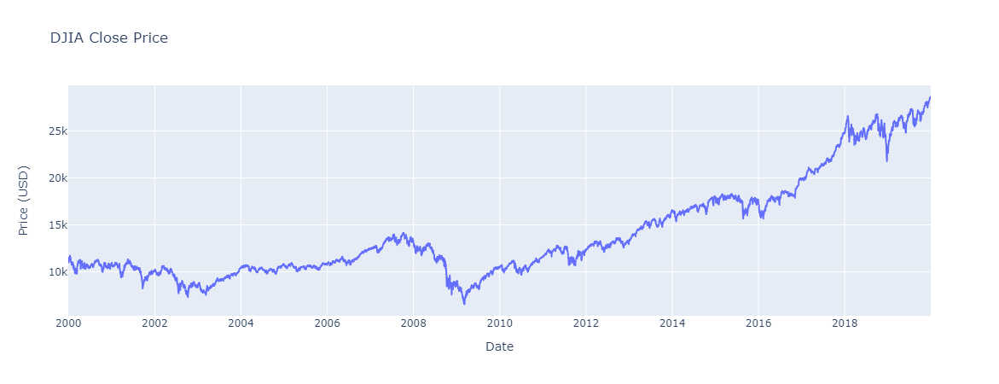

In [4]:
import plotly.graph_objs as go
import plotly.express as px

fig = px.line(df['Close'])
fig.layout = go.Layout({"title": "DJIA Close Price",
                           "yaxis": {"title":"Price (USD)"},
                           "xaxis": {"title":"Date"},
                           "showlegend": False})
fig.show()

### Log Diff

In [5]:
# use log base 10 for percentage change
df['LogDiff'] = np.concatenate(([0], np.diff(np.log(df['Close'].values), n=1)))

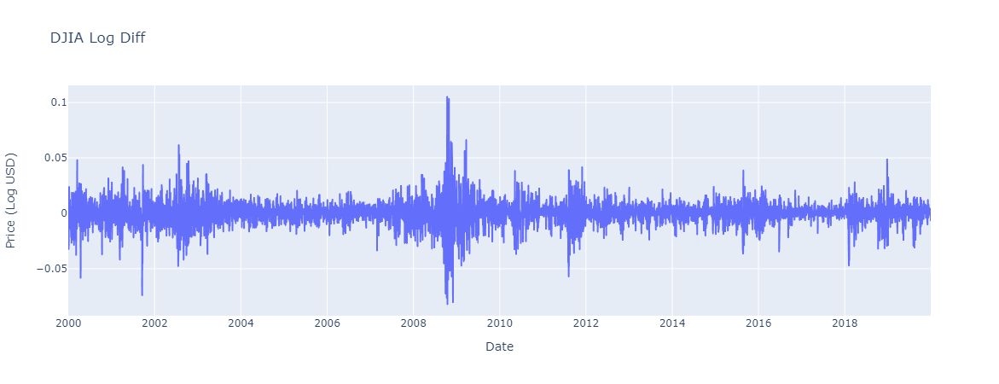

In [6]:
fig = px.line(df['LogDiff'])
fig.layout = go.Layout({"title": "DJIA Log Diff",
                           "yaxis": {"title":"Price (Log USD)"},
                           "xaxis": {"title":"Date"},
                           "showlegend": False})
fig.show()

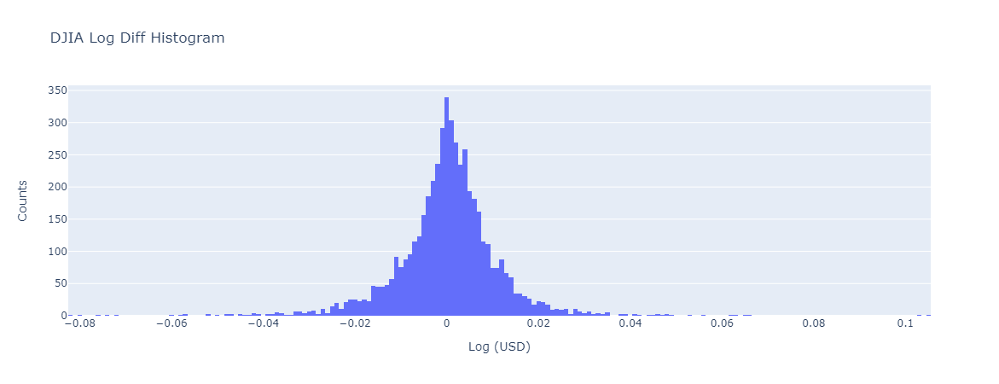

In [7]:
fig = px.histogram(df['LogDiff'])
fig.layout = go.Layout({"title": "DJIA Log Diff Histogram",
                           "yaxis": {"title":"Counts"},
                           "xaxis": {"title":"Log (USD)"},
                           "showlegend": False})
fig.show()

In [8]:
categories = [-0.015, -0.005, 0, 0.005, 0.015]

def to_categorical(log_diff):
    val = min(categories, key=lambda x:abs(x-log_diff))
    category = categories.index(val)
    #print(log_diff, val, category)
    return category
    
df['category'] = df['LogDiff'].apply(lambda row: to_categorical(row))

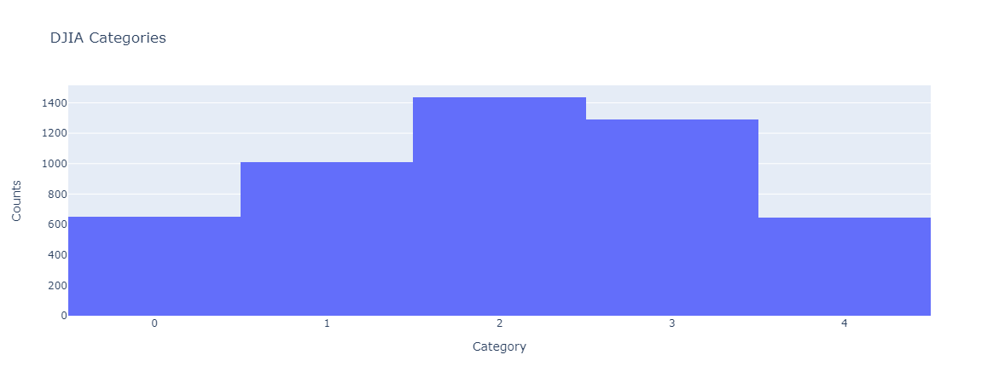

In [9]:
fig = px.histogram(df['category'])
fig.layout = go.Layout({"title": "DJIA Categories",
                           "yaxis": {"title":"Counts"},
                           "xaxis": {"title":"Category"},
                           "showlegend": False})
fig.show()

In [10]:
import tensorflow as tf
import numpy as np

class TCNDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data, train_timesteps=100, batch_size=128, n_channels=1, shuffle=True):
        self.data = data
        self.train_timesteps = train_timesteps
        self.pred_timesteps = 1 # for categorical we currently only looking at the next sample
        self.batch_size = batch_size
        self.n_channels = n_channels
        self.signals = (len(self.data)-(self.train_timesteps+self.pred_timesteps))
        self.indexes = np.arange(self.signals-1)
        if shuffle:
            np.random.shuffle(self.indexes)
        
    def __len__(self):
        return int(np.floor( self.signals / self.batch_size )-1)
        
    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        start_indicies = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        #print(start_indicies)
        
        # Generate data
        X, y = self.__data_generation(start_indicies)

        return X, y
    
    def on_epoch_end(self):
        return
    
    def __data_generation(self, start_indicies):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, self.train_timesteps, self.n_channels))
        y = np.empty((self.batch_size, self.pred_timesteps))
        
        # Generate sequence data
        for i, index in enumerate(start_indicies):
            
            #print(i, index, index+self.train_timesteps, index+self.train_timesteps+self.pred_timesteps, len(self.data))
            # Store sample
            X[i,:,0] = self.data[index:index+self.train_timesteps]

            # This is for sequence prediction
            if self.pred_timesteps == 1:
                y[i, 0] = to_categorical(self.data[index+self.train_timesteps])
            else:
                y[i, :] = self.data[index+self.train_timesteps:index+self.train_timesteps+self.pred_timesteps]
            
            # This is for fluctuation prediction
            # d_ = (self.data[index+self.train_timesteps-1] - self.data[index+self.train_timesteps-2])/(self.data[index+self.train_timesteps-2])
            # d = (self.data[index+self.train_timesteps] - self.data[index+self.train_timesteps-1])/(self.data[index+self.train_timesteps-1])
            # y[i,:] = d - d_
                                                                                                             
        return X, y #tf.keras.utils.to_categorical(y, num_classes=len(categories))

In [11]:
gen = TCNDataGenerator(data = df['LogDiff'].values,
                              train_timesteps = 432,
                              batch_size = 256)

In [12]:
len(gen)

16

In [13]:
x, y = gen[len(gen)]

In [14]:
print(x.shape, y.shape)
print(x.dtype, y.dtype)

(256, 432, 1) (256, 1)
float64 float64


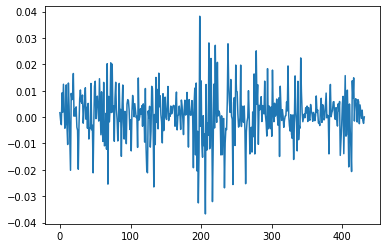

[1.]


In [15]:
import matplotlib.pyplot as plt
plt.plot(x[0])
plt.show()
print(y[0])

### Metric for Fluctuation

First, get time intervals of abrupt changes by figuring out the difference of stock fluctuation degree D(fluctuation) between two adjacent stock trading days

\begin{equation*}
D_{fluctutation}
=
\frac{x_t-x_{t-1}}{x_{t-1}}
\end{equation*}

where x at time t denotes the stock price value on the stock trading day t. Then the difference of fluctuation degree C is defined by:

\begin{equation*}
C_{i}
=
D_{fluctutation_{i}} - D_{fluctutation_{i-1}}
\end{equation*}

If $C_{i}$ exceeds a certain threshold, it can be considered that the stock price abruptly changes at the ith day.

In [16]:
from tensorflow.keras import Input, optimizers, Model
from tensorflow.keras.layers import Activation, Dense
from tensorflow.keras import backend as K
from tcn import TCN

def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true))) 

def build_tcn(max_len, num_feat, num_classes, lr=0.002):
    # Receptive field = nb_stacks_of_residuals_blocks * kernel_size * last_dilation.
    # --> 24 * 8 * 1 = 216
    input_layer = Input(shape=(max_len, num_feat))
    x = TCN(nb_filters=24, 
            kernel_size=8, 
            nb_stacks=1, 
            dilations=[2 ** i for i in range(8)],
            padding='causal',
            use_skip_connections=True, 
            dropout_rate=0.30, 
            return_sequences=False,
            activation='relu', 
            kernel_initializer='he_normal', 
            use_batch_norm=False, 
            use_layer_norm=False,
            name='tcn')(input_layer)
    opt = optimizers.Adam(lr=lr, clipnorm=1.)
    
    # classification
    x = Dense(num_classes)(x)
    x = Activation('softmax')(x)
    output_layer = x
    print(output_layer.shape)
    model = Model(input_layer, output_layer)

    def accuracy(y_true, y_pred):
        # reshape in case it's in shape (num_samples, 1) instead of (num_samples,)
        if K.ndim(y_true) == K.ndim(y_pred):
            y_true = K.squeeze(y_true, -1)
        # convert dense predictions to labels
        y_pred_labels = K.argmax(y_pred, axis=-1)
        y_pred_labels = K.cast(y_pred_labels, K.floatx())
        return K.cast(K.equal(y_true, y_pred_labels), K.floatx())

    model.compile(optimizers.Adam(lr=lr, clipnorm=1.), loss='sparse_categorical_crossentropy', metrics=[accuracy])
    return model

In [17]:
import matplotlib.pyplot as plt

def GetSpacedElements(array, numElems = 4):
    out = array[np.round(np.linspace(0, len(array)-1, numElems)).astype(int)]
    return out

def visualise_test(data, real_data, tst_idx, model, input_length, output_length, visualise=4):
    start_indicies = GetSpacedElements(tst_idx[0:len(tst_idx)-(input_length+output_length)], visualise)
    print(start_indicies)
    for st_index in start_indicies:
        print(st_index)
        X = data[st_index:st_index+input_length]
        real_X = real_data[st_index:st_index+input_length]
        print(X.shape)
        y_pred = np.argmax(model(np.expand_dims(X, axis=0)))
        y_true = to_categorical(data[st_index+input_length])
        plt.figure(figsize=(10,7))
        plt.subplot(211)
        plt.plot(np.arange(len(X)), X)
        plt.subplot(212)
        plt.plot(np.arange(len(real_X)), real_X)
        plt.title('Predicted: {}, Actual: {}'.format(categories[y_pred], categories[y_true]))
        plt.show()

In [18]:
def test_error_count(gen):
    x_error_count = 0
    y_error_count = 0
    for g_i in range(len(gen)+1):
        x, y = gen[g_i]
        for i in range(x.shape[0]):
            if np.mean(x[i,:,0]) < 5000:
                x_error_count += 1
            if y[i,0] < 5000:
                y_error_count += 1
    print(x_error_count, y_error_count)

Fold: 1
(None, 5)
Fitting...
Epoch 1/100
2/2 [==============================] - 0s 55ms/step - loss: 1.7210 - accuracy: 0.2266
Epoch 2/100
2/2 [==============================] - 0s 85ms/step - loss: 1.6116 - accuracy: 0.2148
Epoch 3/100
2/2 [==============================] - 0s 88ms/step - loss: 1.6077 - accuracy: 0.1797
Epoch 4/100
2/2 [==============================] - 0s 81ms/step - loss: 1.6013 - accuracy: 0.2246
Epoch 5/100
2/2 [==============================] - 0s 83ms/step - loss: 1.5993 - accuracy: 0.2344
Epoch 6/100
2/2 [==============================] - 0s 84ms/step - loss: 1.5931 - accuracy: 0.2402
Epoch 7/100
2/2 [==============================] - 0s 86ms/step - loss: 1.5988 - accuracy: 0.2461
Epoch 8/100
2/2 [==============================] - 0s 86ms/step - loss: 1.6001 - accuracy: 0.2285
Epoch 9/100
2/2 [==============================] - 0s 86ms/step - loss: 1.6014 - accuracy: 0.2246
Epoch 10/100
2/2 [==============================] - 0s 83ms/step - loss: 1.5935 - accurac

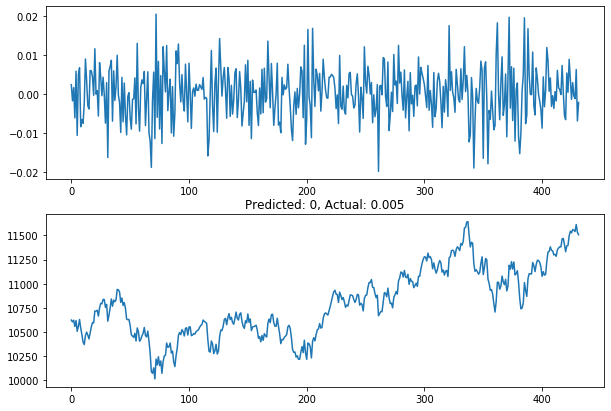

1534
(432,)


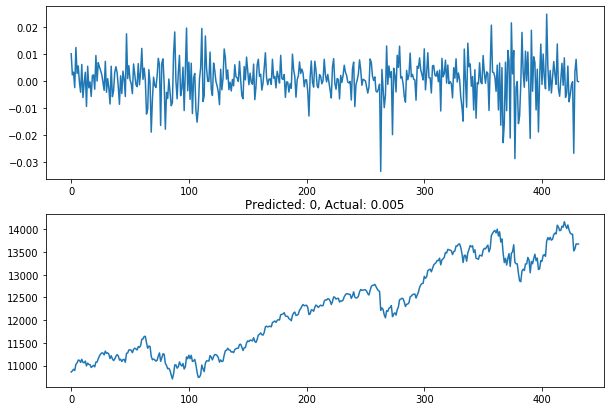

1809
(432,)


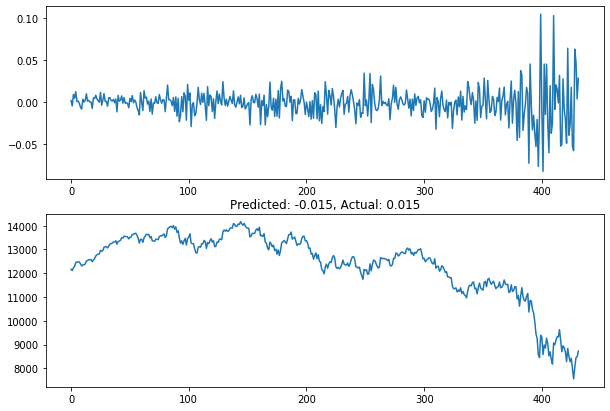

2083
(432,)


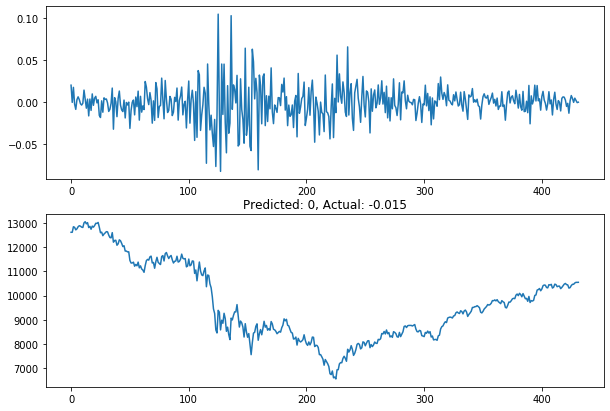

Fold: 2
(None, 5)
Fitting...
Epoch 1/100
7/7 [==============================] - 1s 99ms/step - loss: 1.6676 - accuracy: 0.2321
Epoch 2/100
7/7 [==============================] - 1s 99ms/step - loss: 1.5977 - accuracy: 0.2679
Epoch 3/100
7/7 [==============================] - 1s 96ms/step - loss: 1.5892 - accuracy: 0.2316
Epoch 4/100
7/7 [==============================] - 1s 97ms/step - loss: 1.5814 - accuracy: 0.2528
Epoch 5/100
7/7 [==============================] - 1s 100ms/step - loss: 1.5783 - accuracy: 0.2372
Epoch 6/100
7/7 [==============================] - 1s 98ms/step - loss: 1.5734 - accuracy: 0.2573
Epoch 7/100
7/7 [==============================] - 1s 97ms/step - loss: 1.5647 - accuracy: 0.2746
Epoch 8/100
7/7 [==============================] - 1s 97ms/step - loss: 1.5538 - accuracy: 0.2852
Epoch 9/100
7/7 [==============================] - 1s 100ms/step - loss: 1.5533 - accuracy: 0.2718
Epoch 10/100
7/7 [==============================] - 1s 98ms/step - loss: 1.5486 - accur

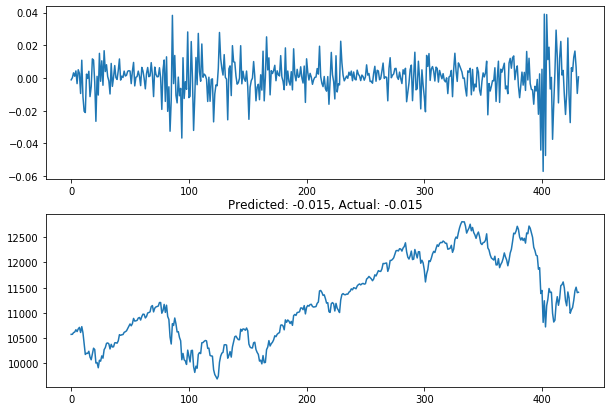

2791
(432,)


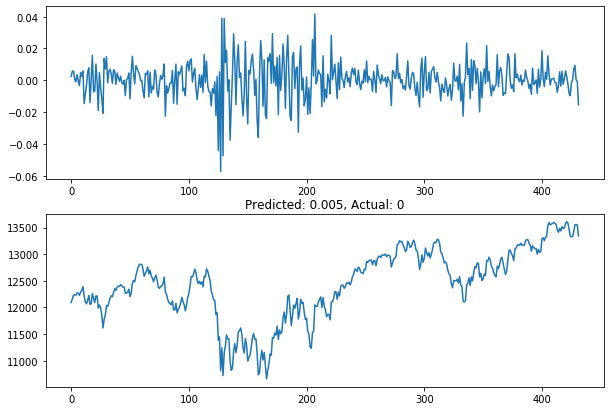

3066
(432,)


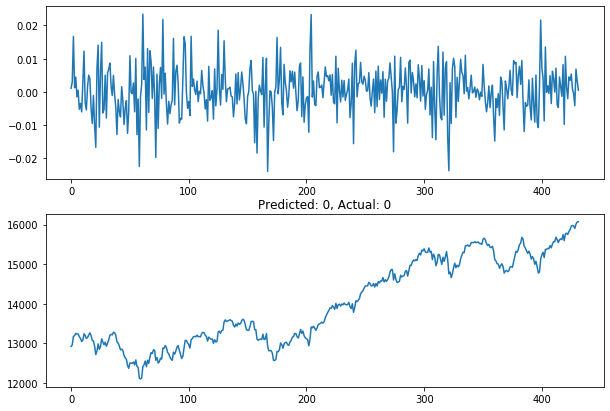

3340
(432,)


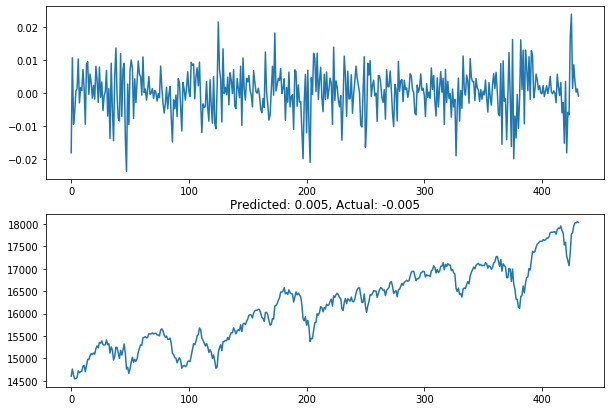

Fold: 3
(None, 5)
Fitting...
Epoch 1/100
12/12 [==============================] - 1s 102ms/step - loss: 1.6002 - accuracy: 0.2581
Epoch 2/100
12/12 [==============================] - 1s 103ms/step - loss: 1.5704 - accuracy: 0.2731
Epoch 3/100
12/12 [==============================] - 1s 101ms/step - loss: 1.5618 - accuracy: 0.2718
Epoch 4/100
12/12 [==============================] - 1s 103ms/step - loss: 1.5538 - accuracy: 0.2731
Epoch 5/100
12/12 [==============================] - 1s 102ms/step - loss: 1.5456 - accuracy: 0.2754
Epoch 6/100
12/12 [==============================] - 1s 99ms/step - loss: 1.5368 - accuracy: 0.2721
Epoch 7/100
12/12 [==============================] - 1s 100ms/step - loss: 1.5307 - accuracy: 0.2757
Epoch 8/100
12/12 [==============================] - 1s 99ms/step - loss: 1.5262 - accuracy: 0.2952
Epoch 9/100
12/12 [==============================] - 1s 101ms/step - loss: 1.5145 - accuracy: 0.3031
Epoch 10/100
12/12 [==============================] - 1s 101ms/s

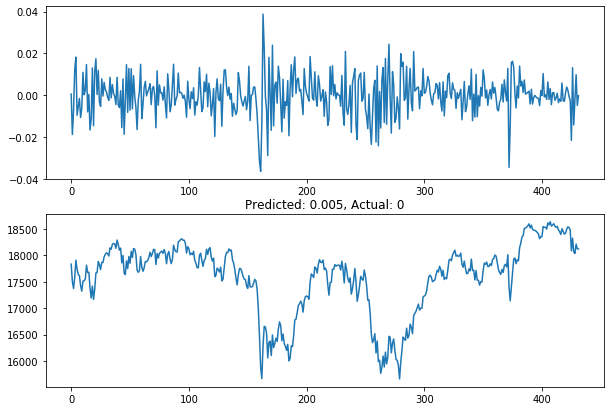

4048
(432,)


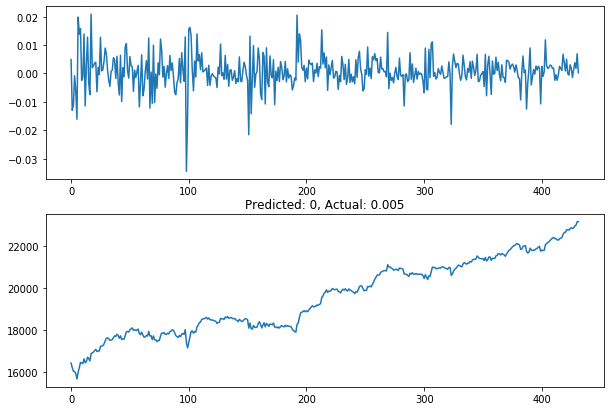

4323
(432,)


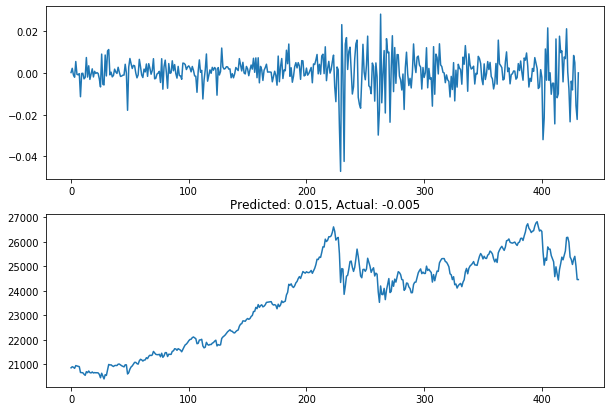

4597
(432,)


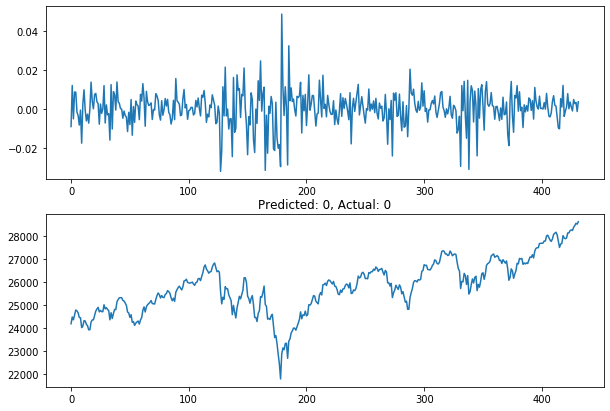

In [19]:
from sklearn.model_selection import TimeSeriesSplit

epochs = 100
input_length = 432

tscv = TimeSeriesSplit(max_train_size=None, n_splits=3)
data = df['LogDiff'].values
#data = df['Close'].values 
fold = 1

for trn_idx, tst_idx in tscv.split(data):
    
        print("Fold: {}".format(fold))
        fold = fold+1
        
        gen = TCNDataGenerator(data = data[trn_idx],
                              train_timesteps = input_length,
                              batch_size = 256)
        model = build_tcn(max_len=input_length, num_feat=1, num_classes=len(categories))
        
        print("Fitting...")
        # Verbosity set to 1 because it doesn't behave very well in Jupyter Notebook
        model.fit(gen, epochs=epochs, verbose=1)
        
        # Test Model
        gen = TCNDataGenerator(data = data[tst_idx],
                      train_timesteps = input_length,
                      batch_size = 256)
        
        print("Evalutating...")
        model.evaluate(gen, verbose=1)
        
        print("Visualising...")
        visualise_test(data, df['Close'].values, tst_idx, model, input_length, 1)

[3774 3782 3791 3799 3807 3816 3824 3832 3841 3849 3857 3865 3874 3882
 3890 3899 3907 3915 3924 3932 3940 3949 3957 3965 3974 3982 3990 3998
 4007 4015 4023 4032 4040 4048 4057 4065 4073 4082 4090 4098 4107 4115
 4123 4131 4140 4148 4156 4165 4173 4181 4190 4198 4206 4215 4223 4231
 4240 4248 4256 4264 4273 4281 4289 4298 4306 4314 4323 4331 4339 4348
 4356 4364 4373 4381 4389 4397 4406 4414 4422 4431 4439 4447 4456 4464
 4472 4481 4489 4497 4506 4514 4522 4530 4539 4547 4555 4564 4572 4580
 4589 4597]
3774
(432,)


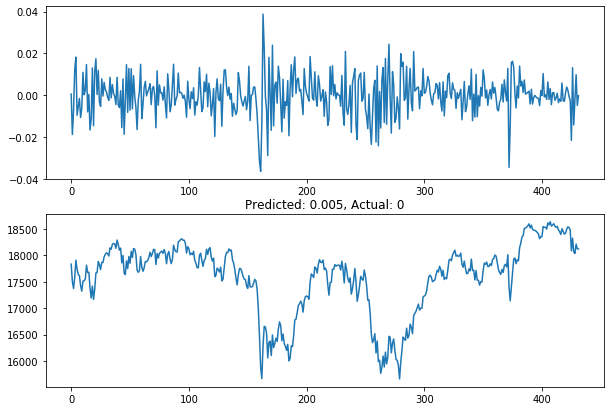

3782
(432,)


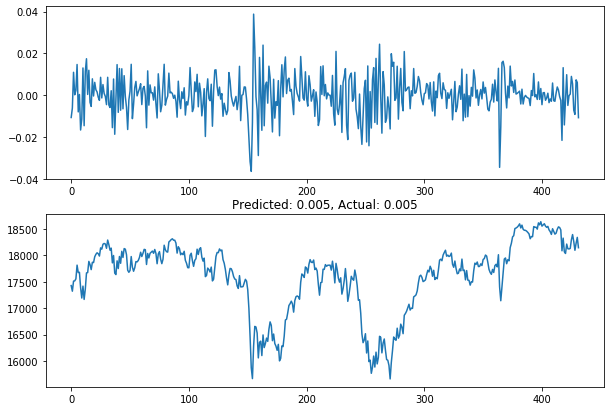

3791
(432,)


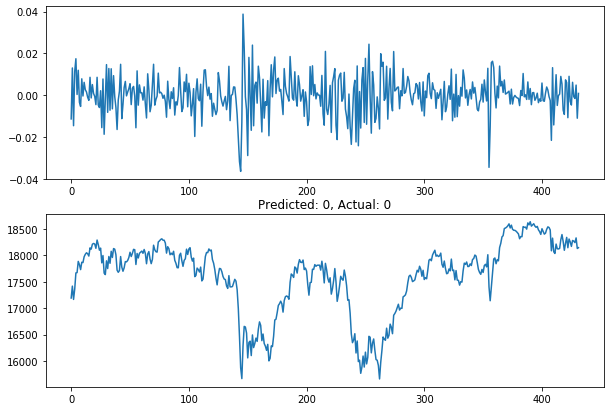

3799
(432,)


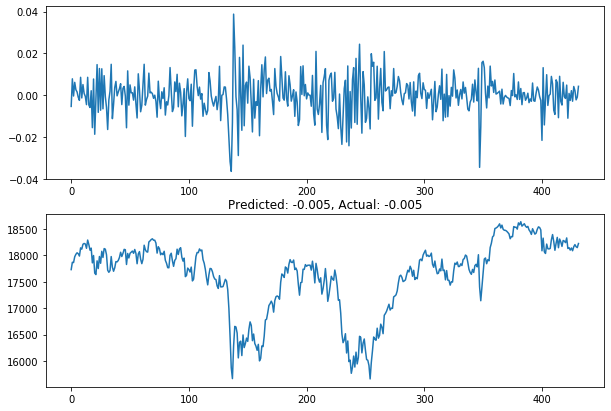

3807
(432,)


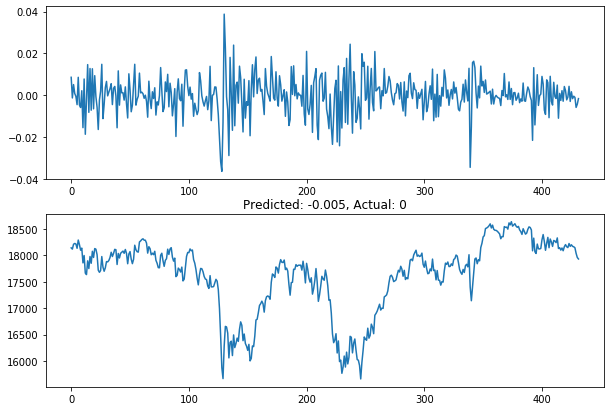

3816
(432,)


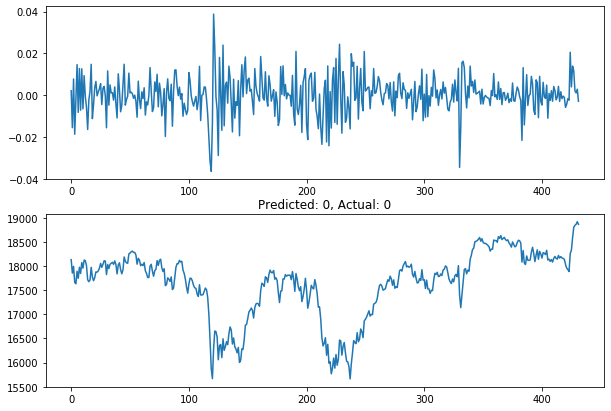

3824
(432,)


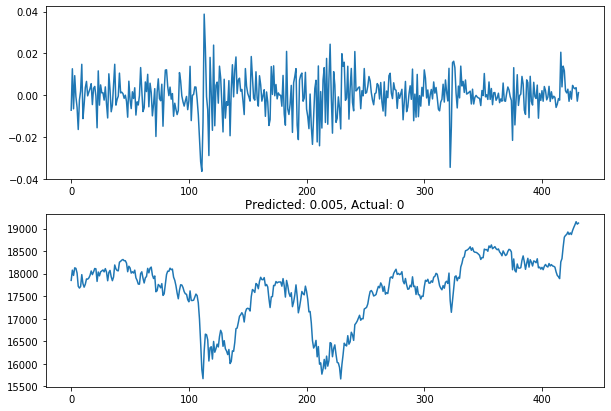

3832
(432,)


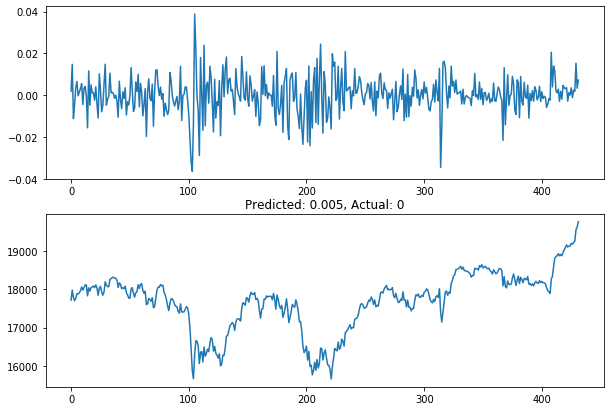

3841
(432,)


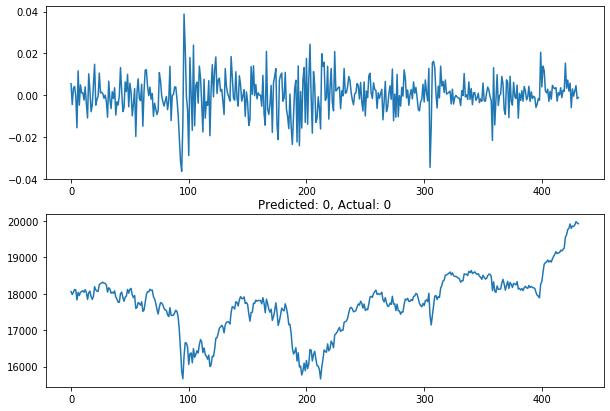

3849
(432,)


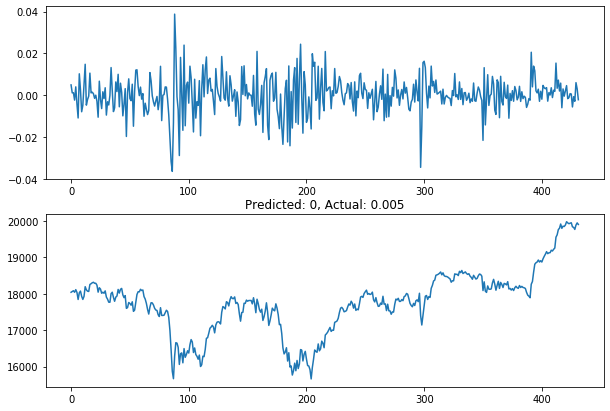

3857
(432,)


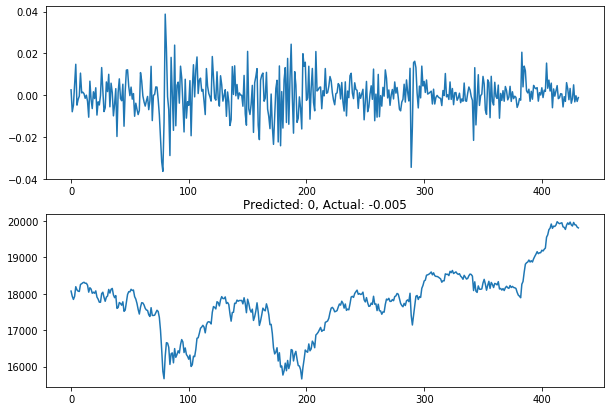

3865
(432,)


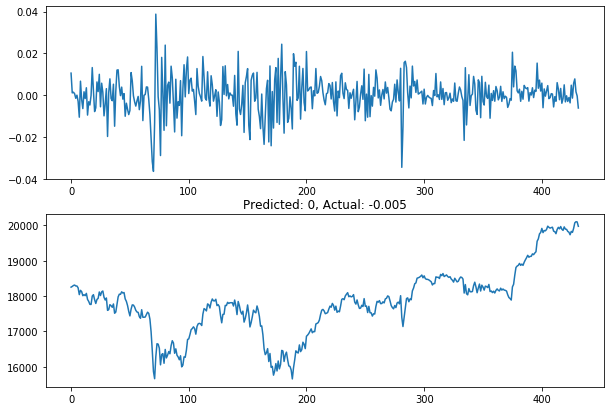

3874
(432,)


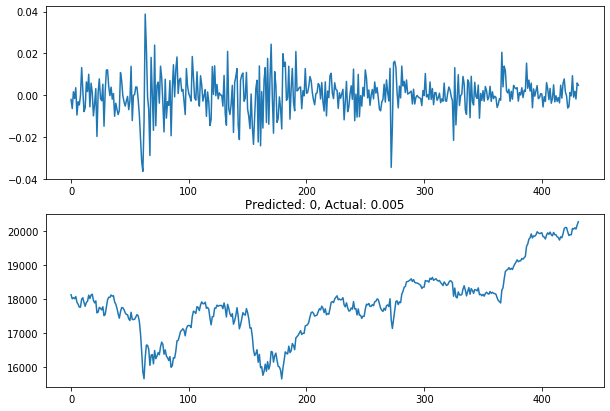

3882
(432,)


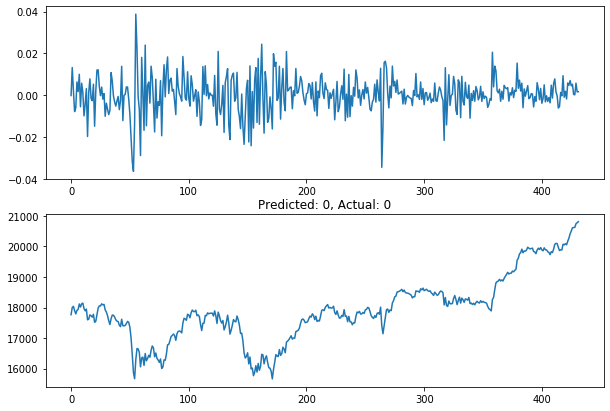

3890
(432,)


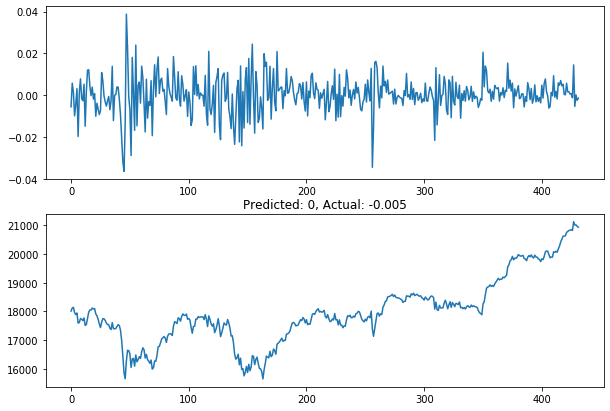

3899
(432,)


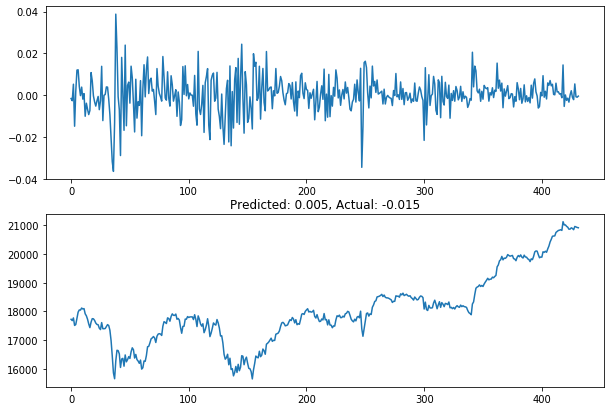

3907
(432,)


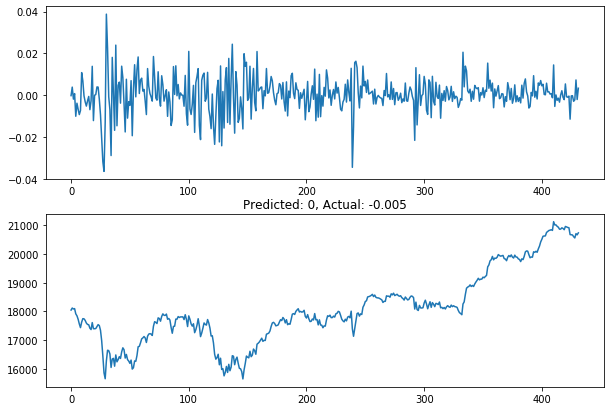

3915
(432,)


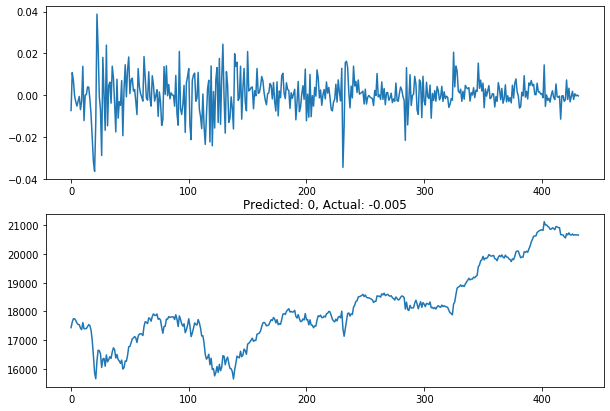

3924
(432,)


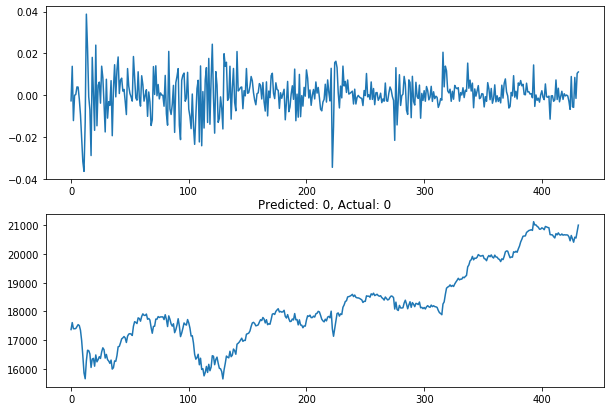

3932
(432,)


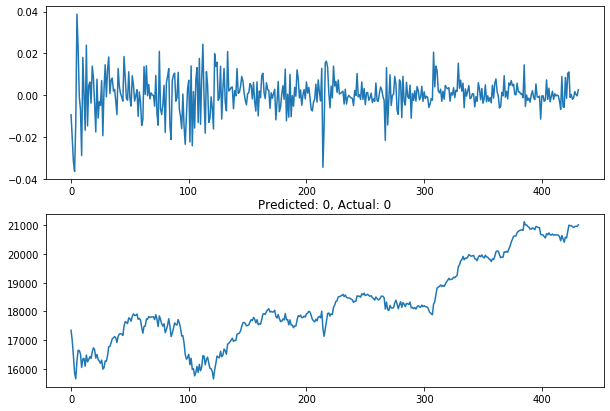

3940
(432,)


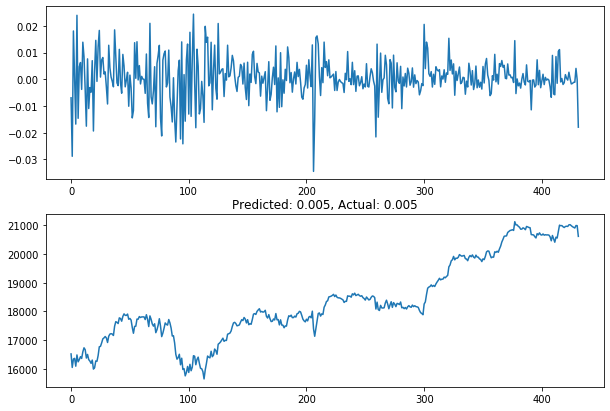

3949
(432,)


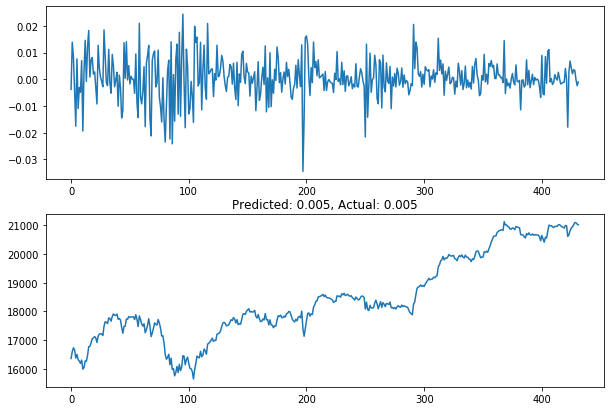

3957
(432,)


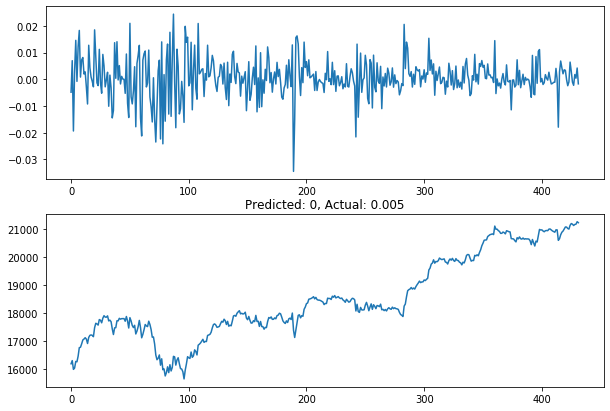

3965
(432,)


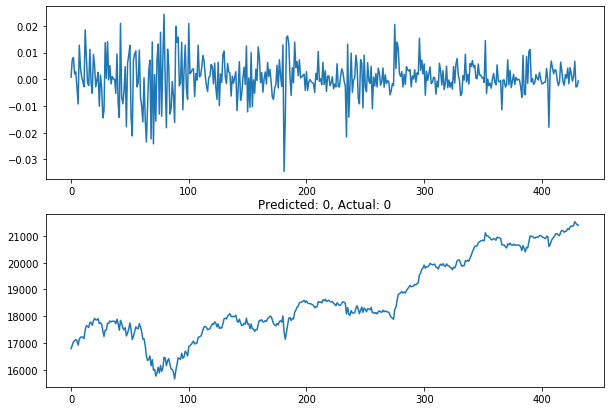

3974
(432,)


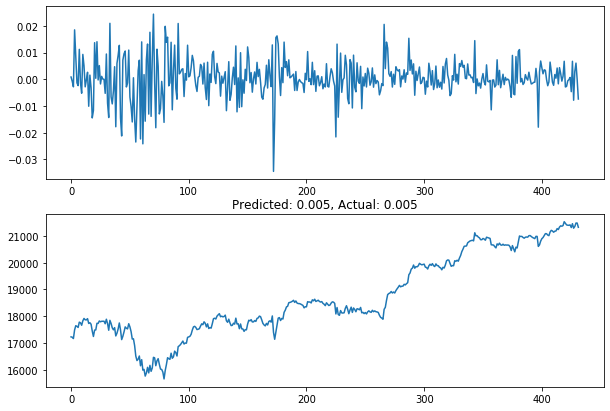

3982
(432,)


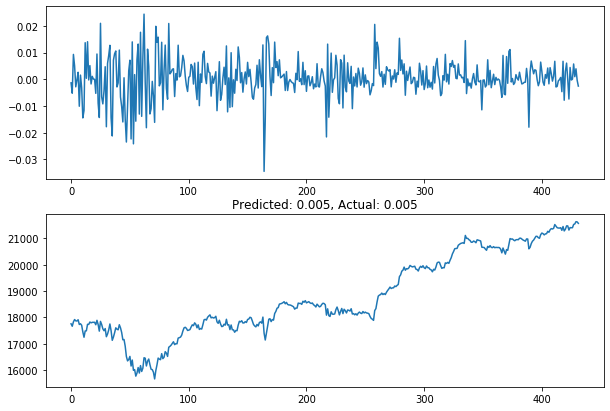

3990
(432,)


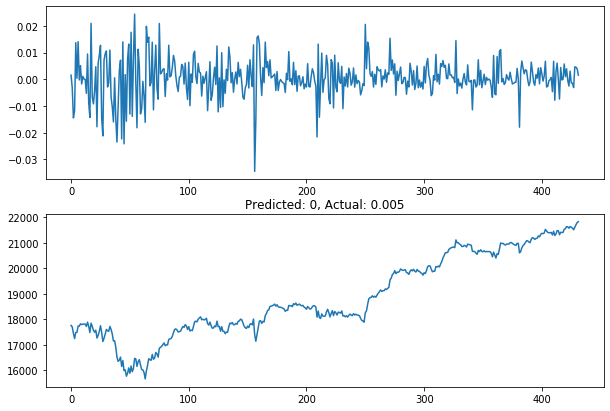

3998
(432,)


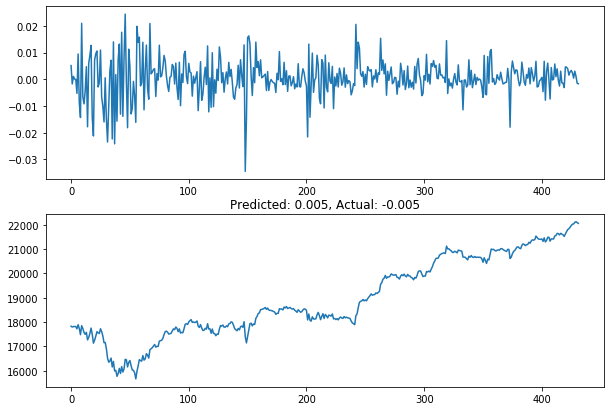

4007
(432,)


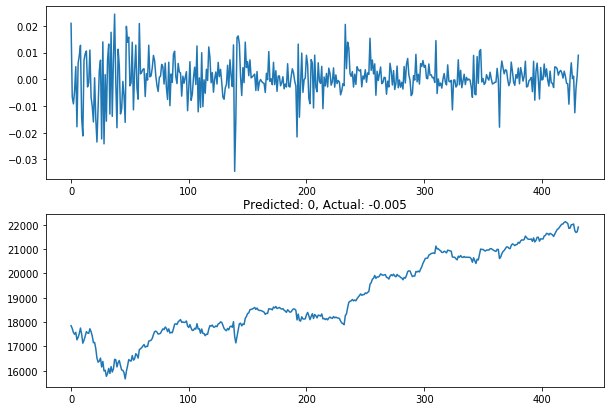

4015
(432,)


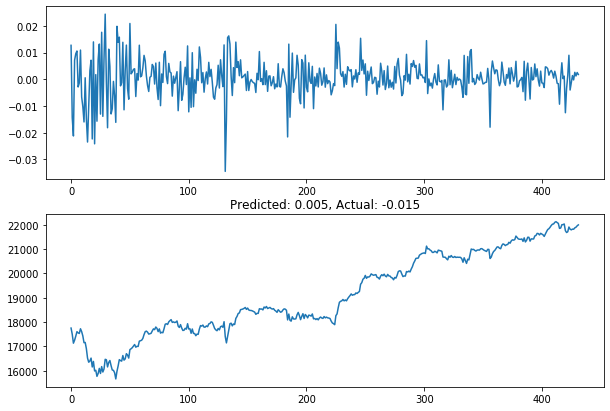

4023
(432,)


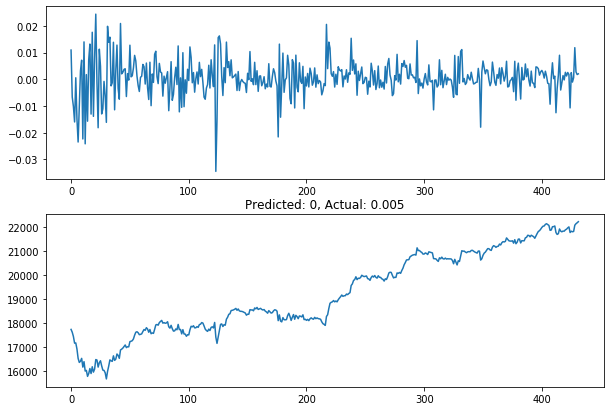

4032
(432,)


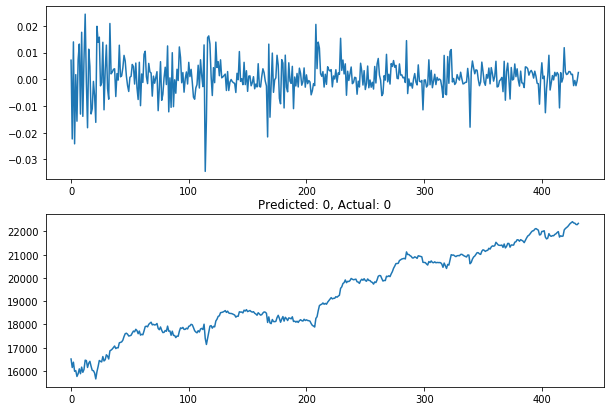

4040
(432,)


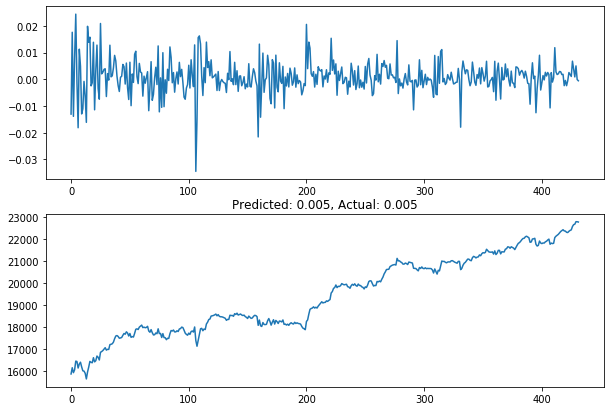

4048
(432,)


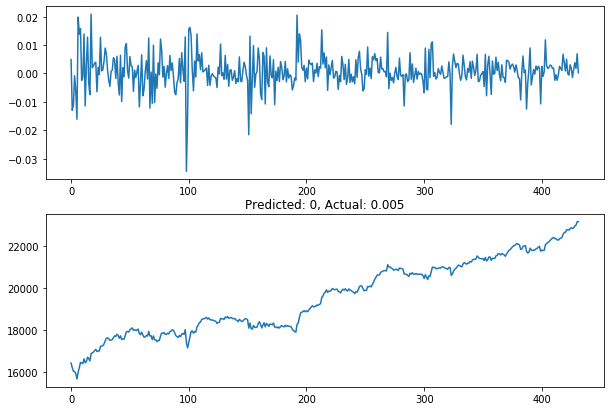

4057
(432,)


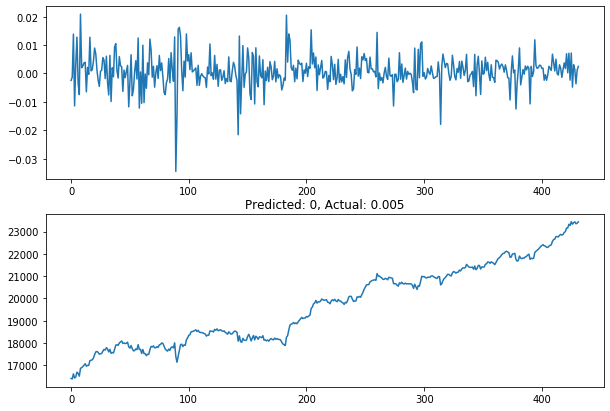

4065
(432,)


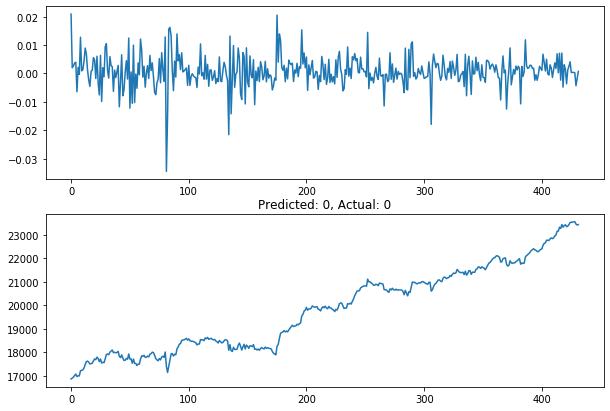

4073
(432,)


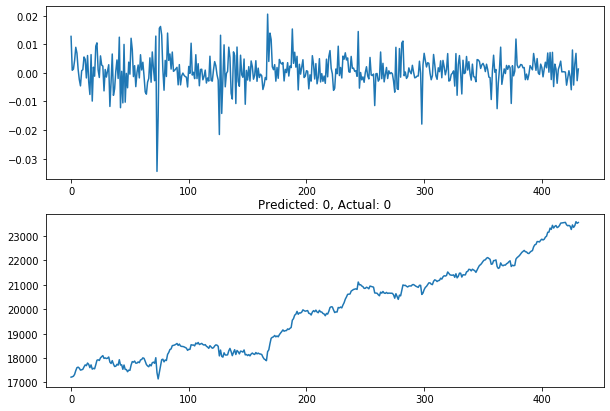

4082
(432,)


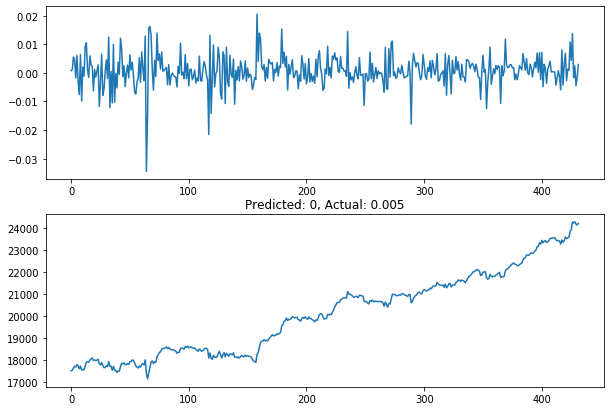

4090
(432,)


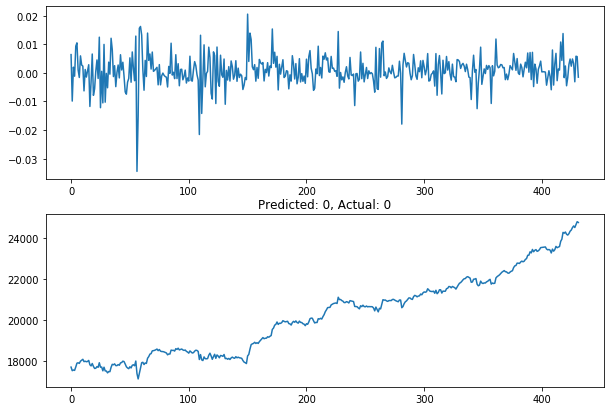

4098
(432,)


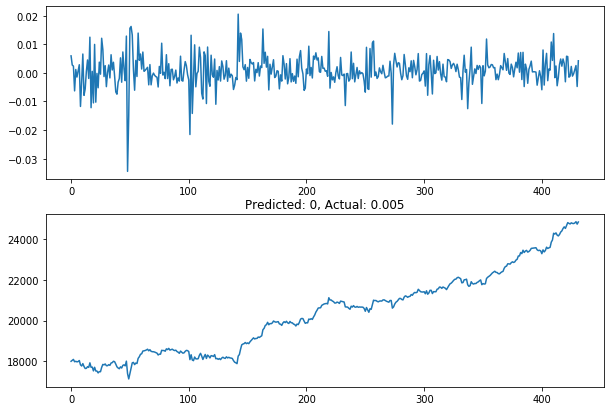

4107
(432,)


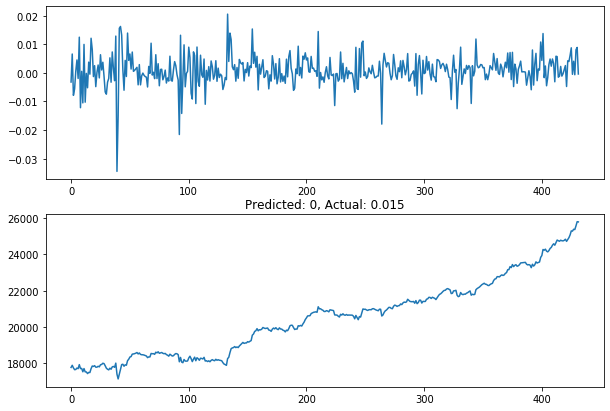

4115
(432,)


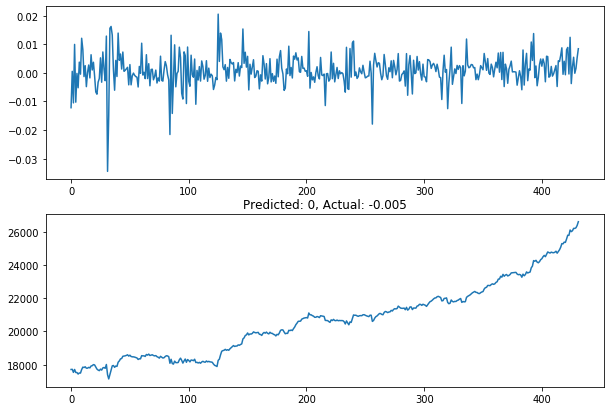

4123
(432,)


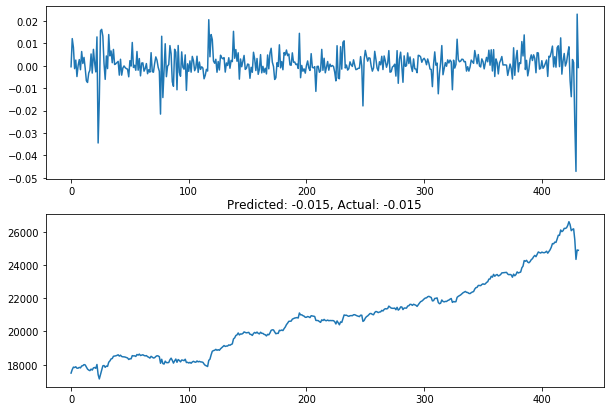

4131
(432,)


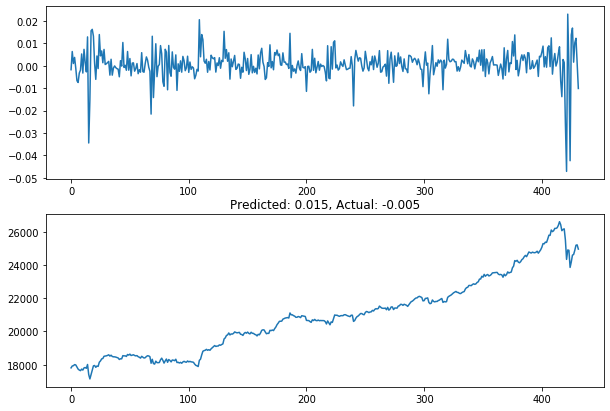

4140
(432,)


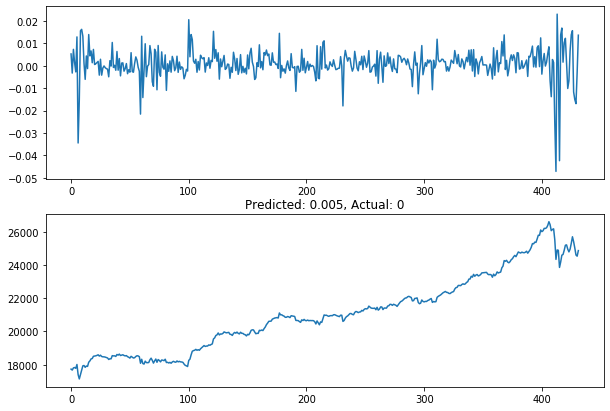

4148
(432,)


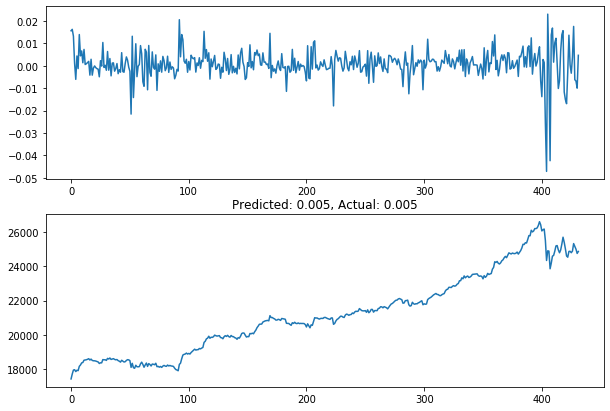

4156
(432,)


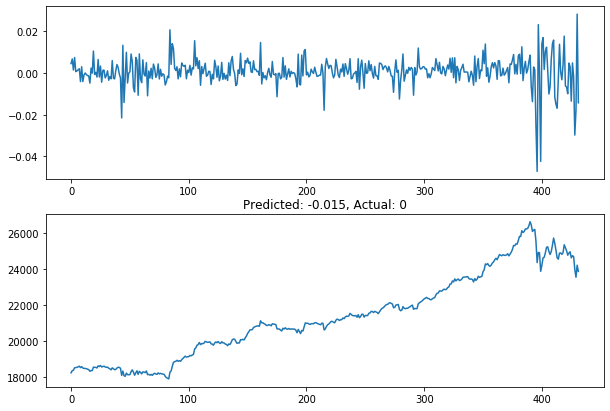

4165
(432,)


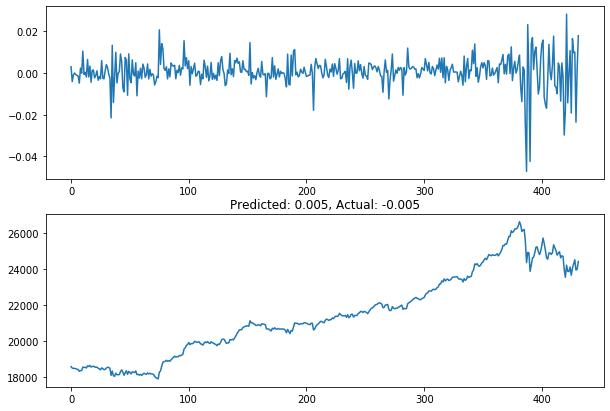

4173
(432,)


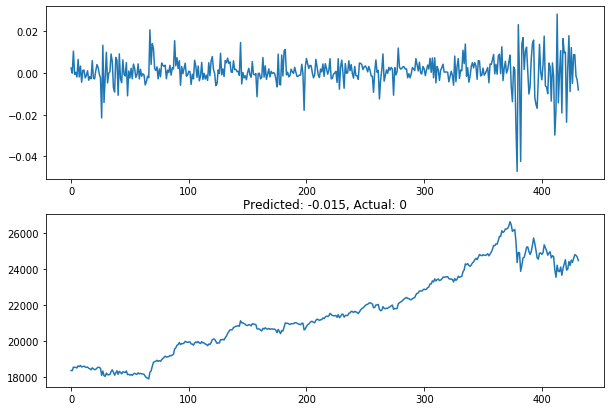

4181
(432,)


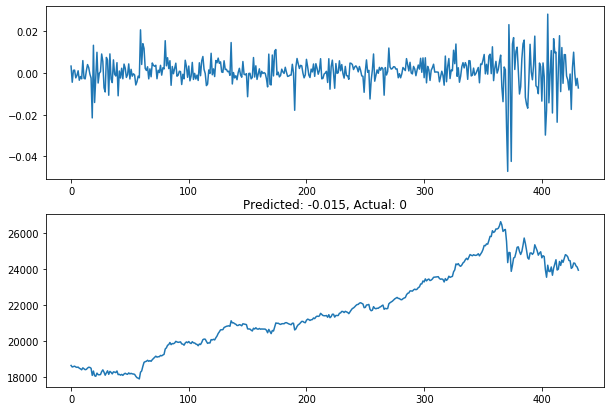

4190
(432,)


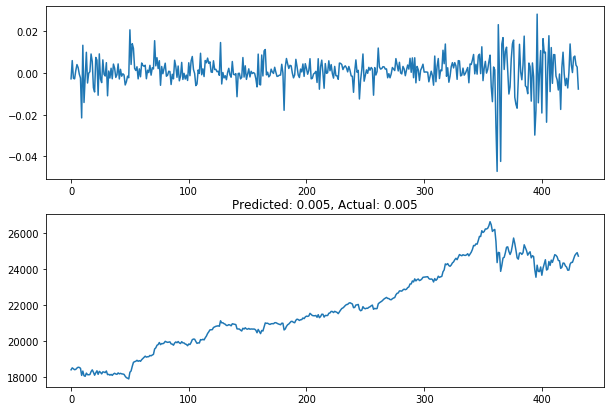

4198
(432,)


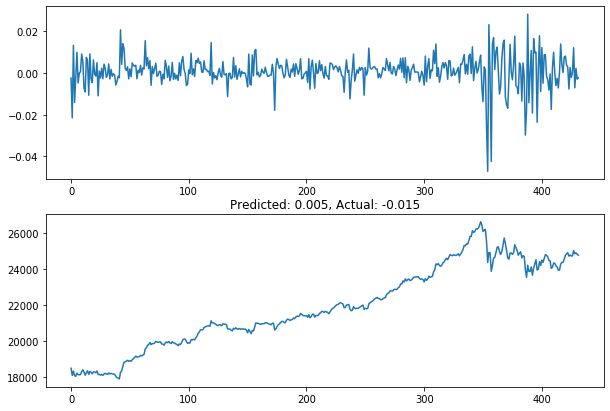

4206
(432,)


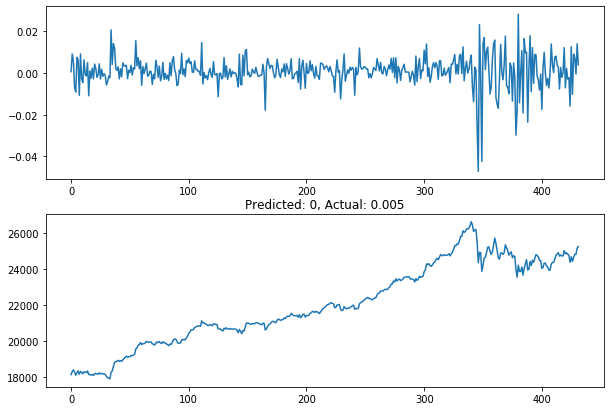

4215
(432,)


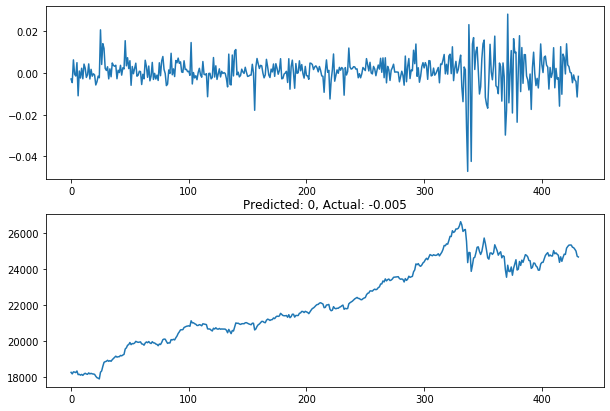

4223
(432,)


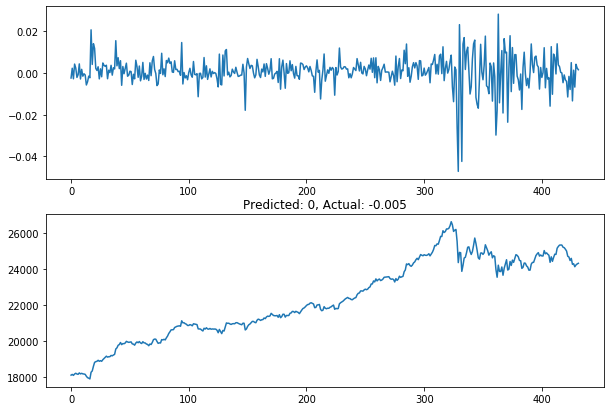

4231
(432,)


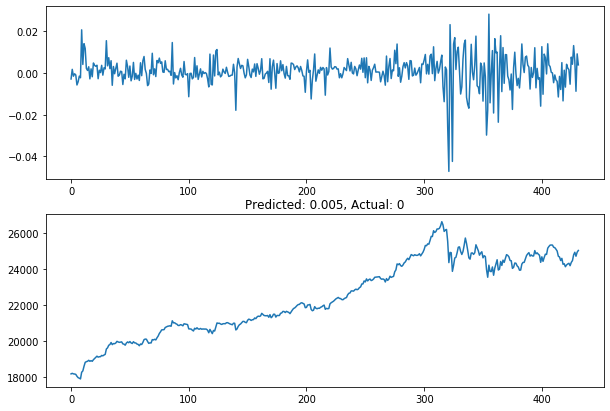

4240
(432,)


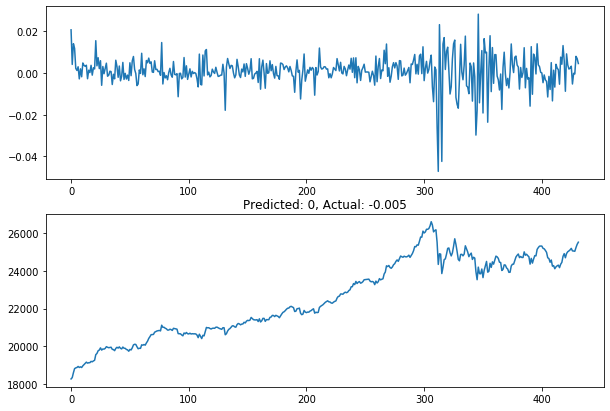

4248
(432,)


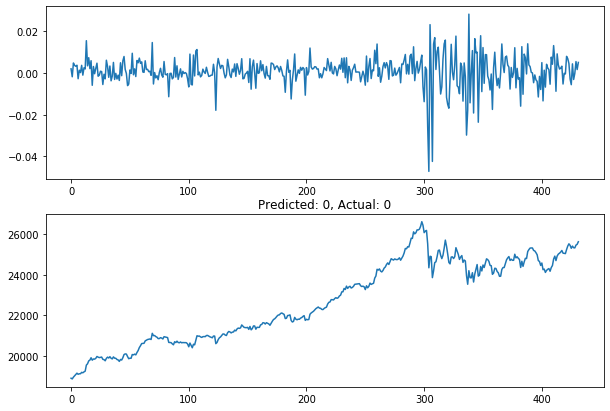

4256
(432,)


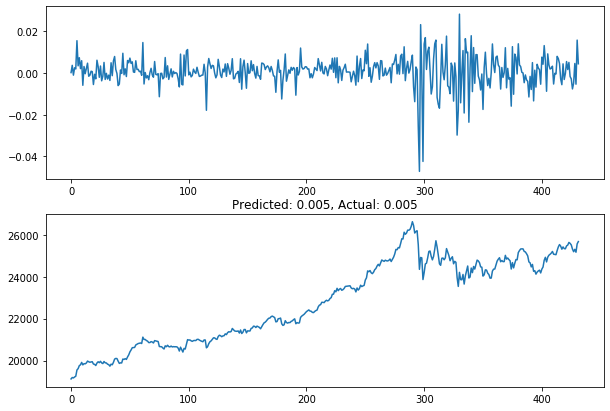

4264
(432,)


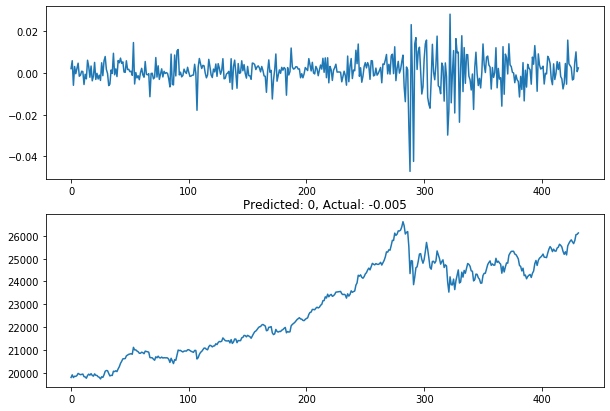

4273
(432,)


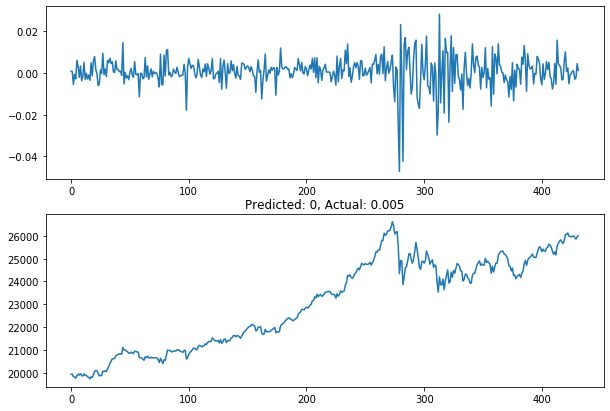

4281
(432,)


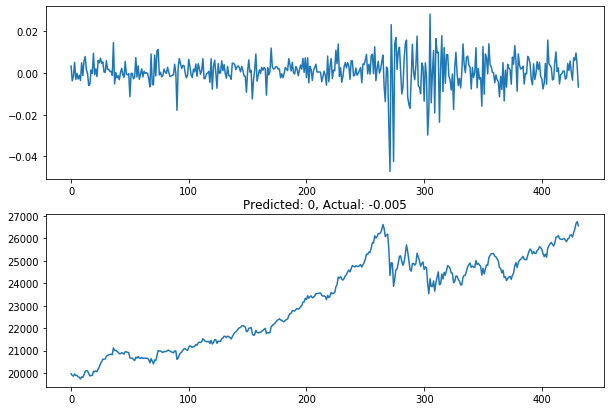

4289
(432,)


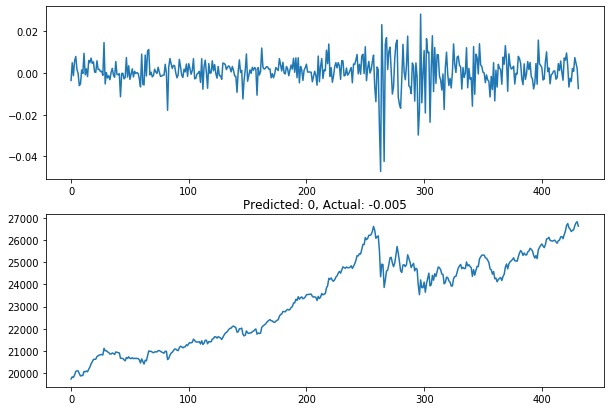

4298
(432,)


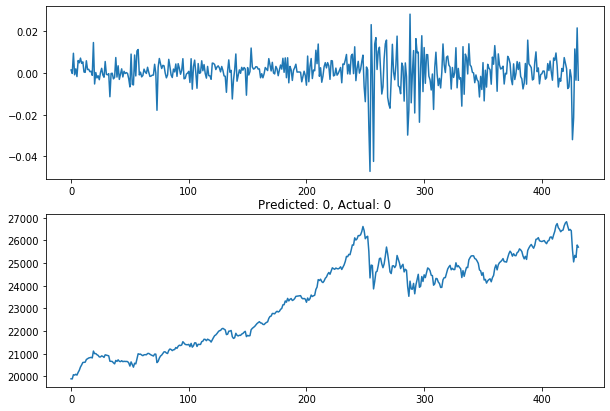

4306
(432,)


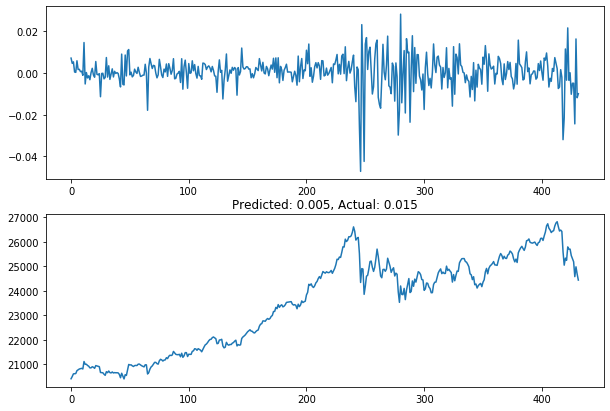

4314
(432,)


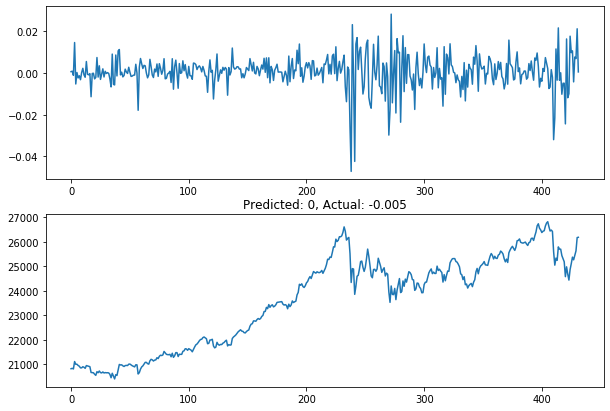

4323
(432,)


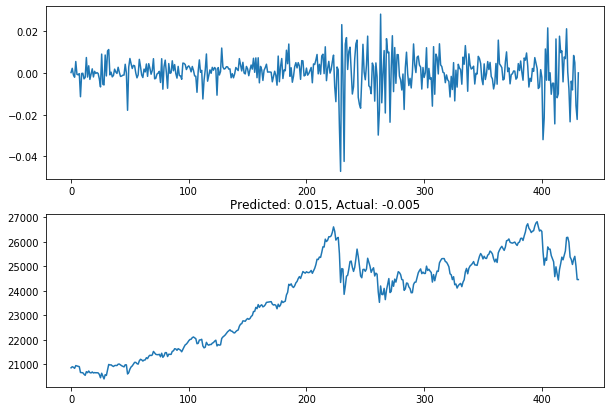

4331
(432,)


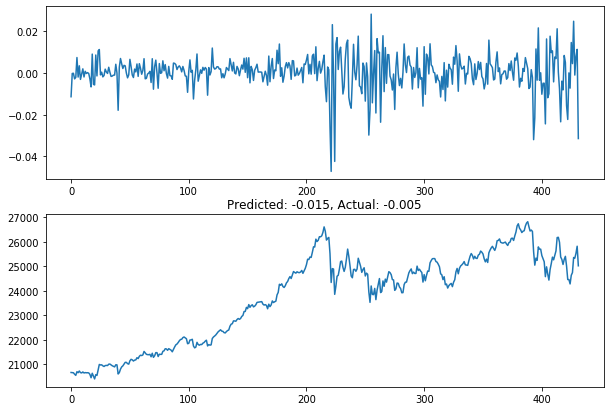

4339
(432,)


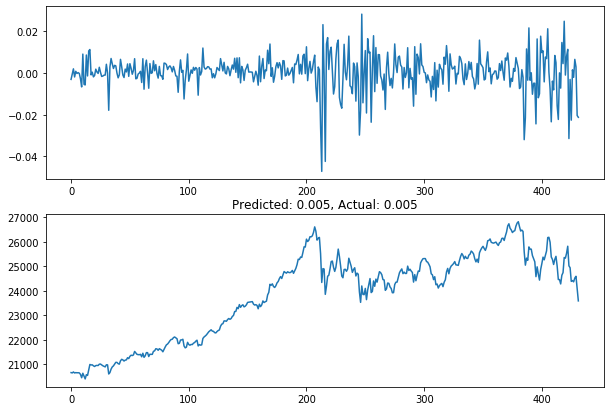

4348
(432,)


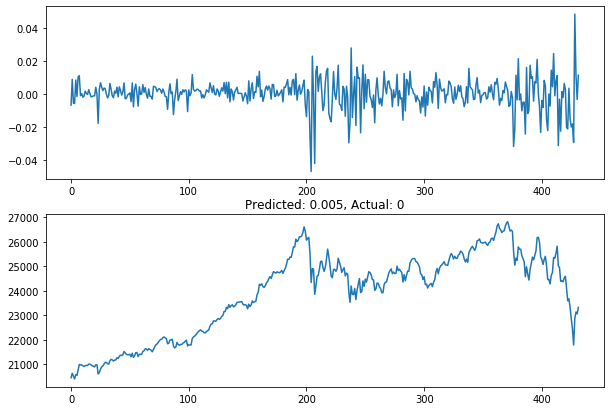

4356
(432,)


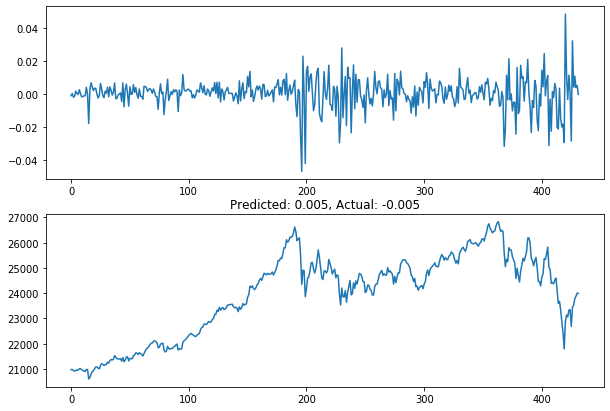

4364
(432,)


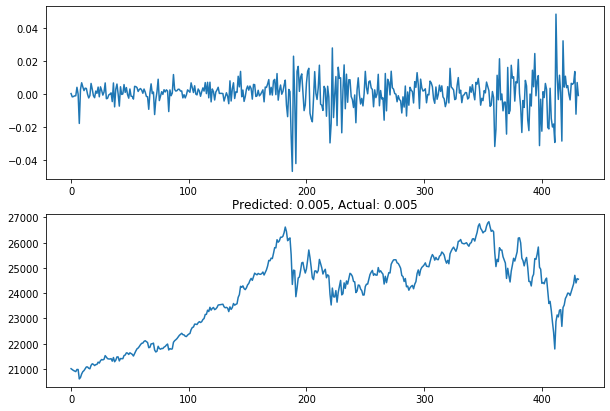

4373
(432,)


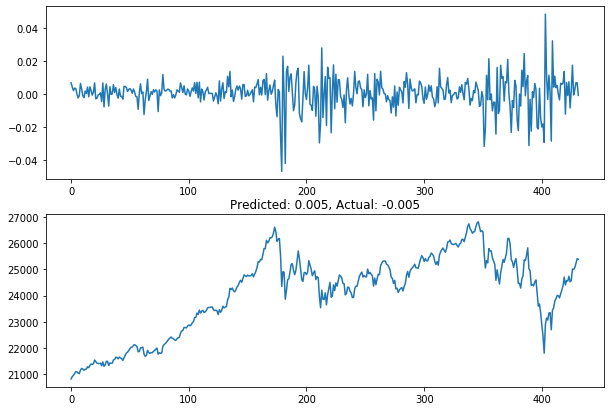

4381
(432,)


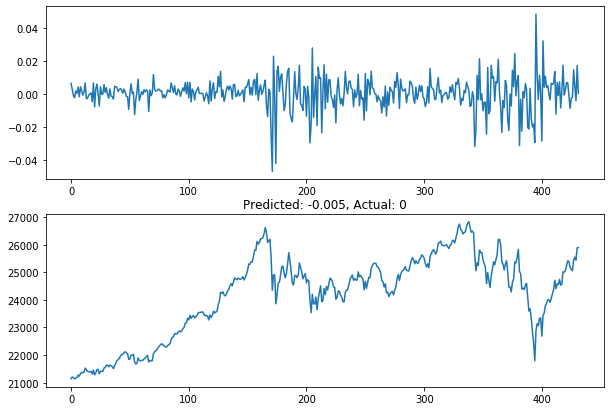

4389
(432,)


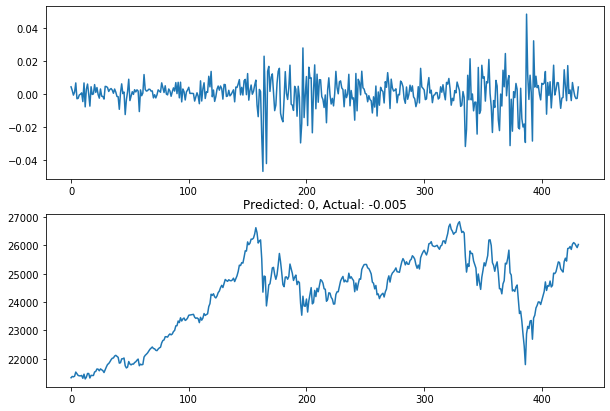

4397
(432,)


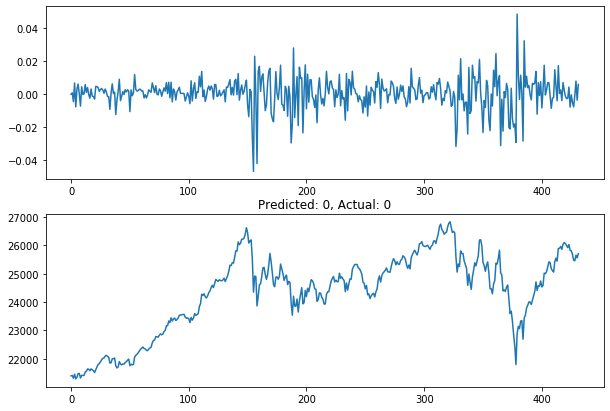

4406
(432,)


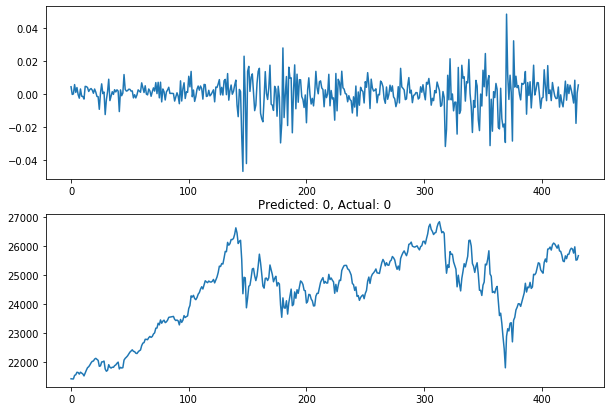

4414
(432,)


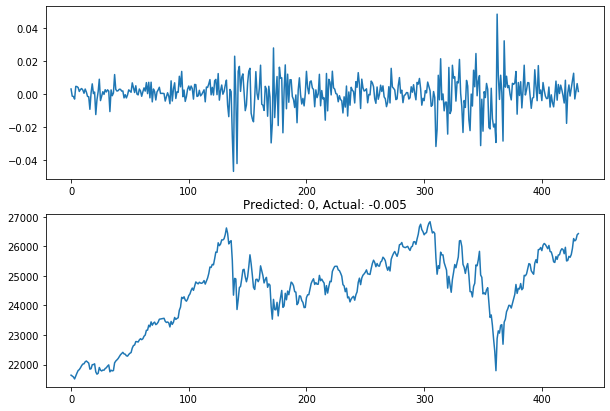

4422
(432,)


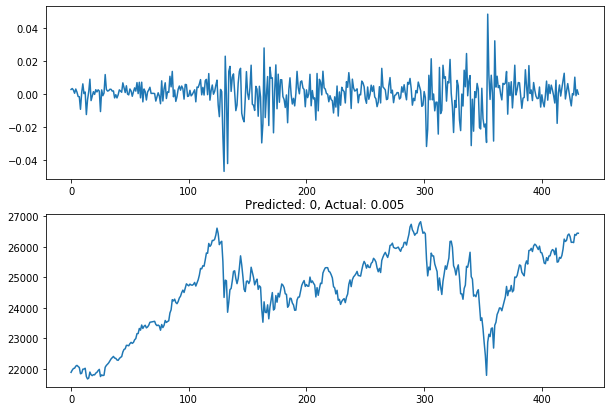

4431
(432,)


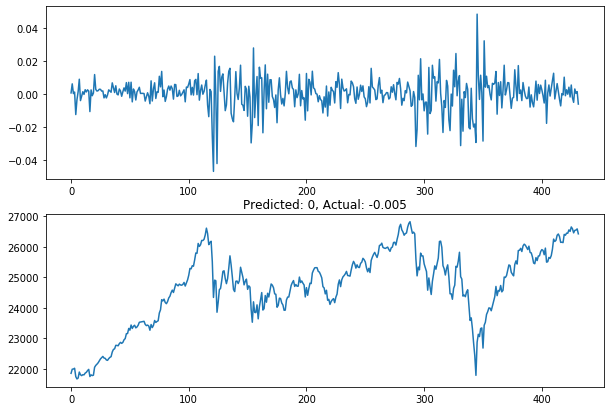

4439
(432,)


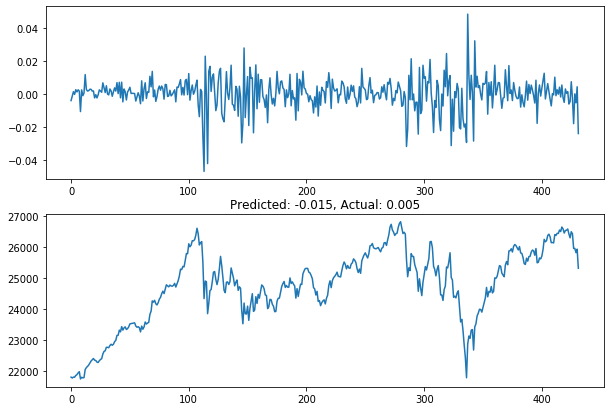

4447
(432,)


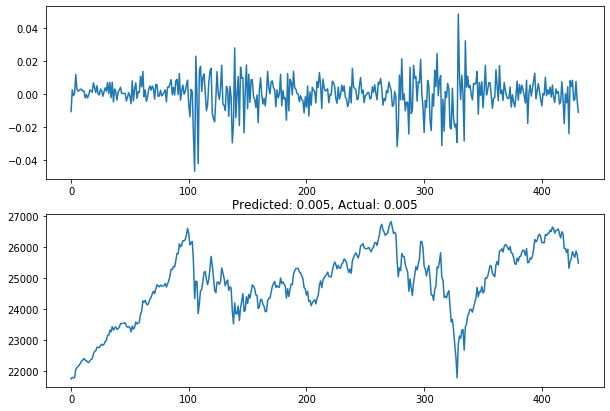

4456
(432,)


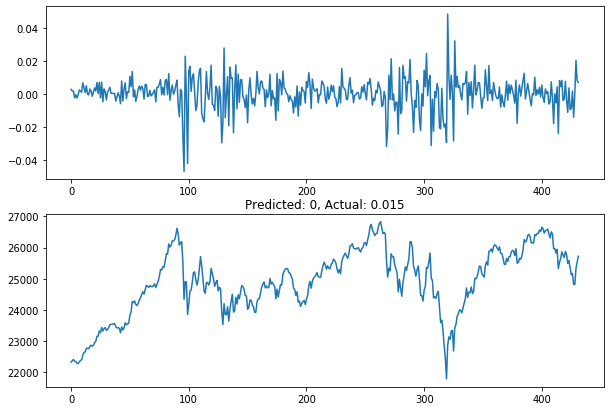

4464
(432,)


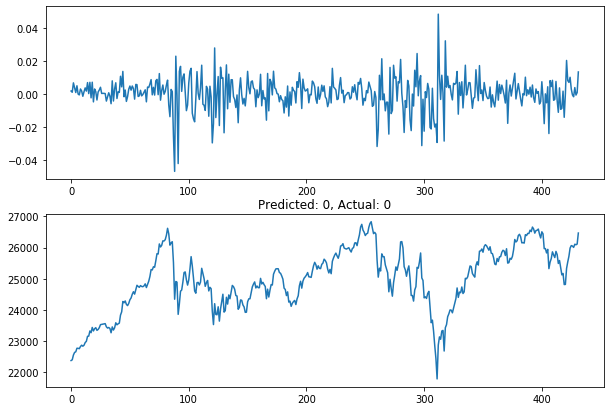

4472
(432,)


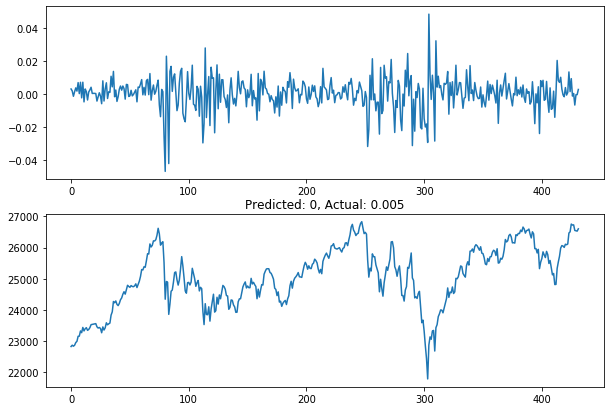

4481
(432,)


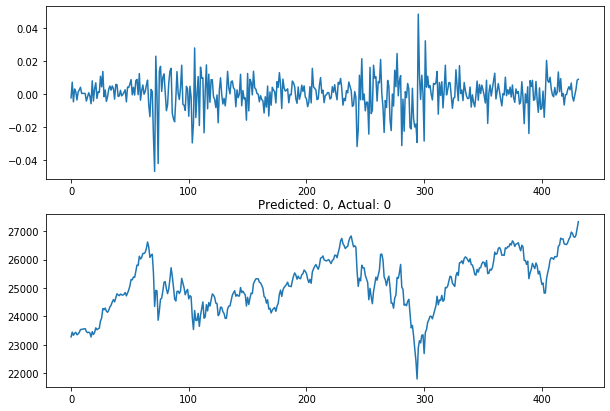

4489
(432,)


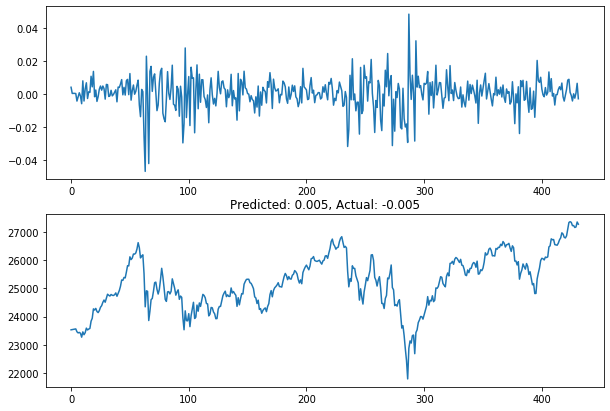

4497
(432,)


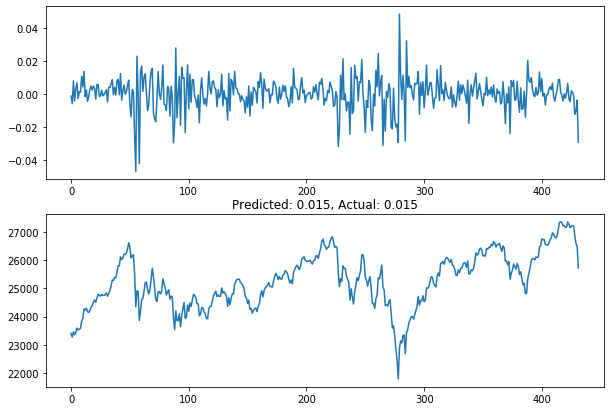

4506
(432,)


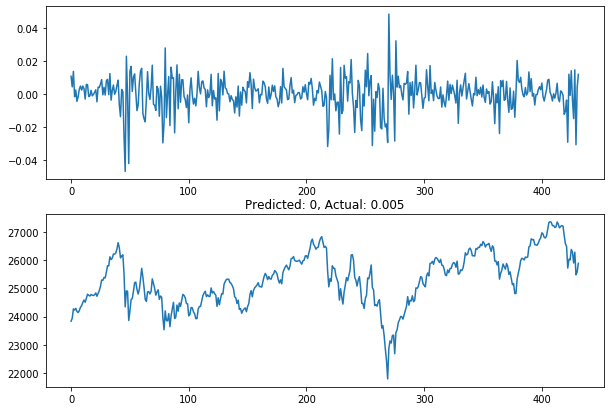

4514
(432,)


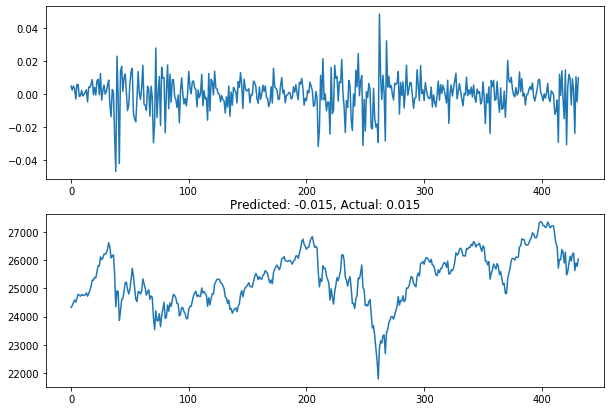

4522
(432,)


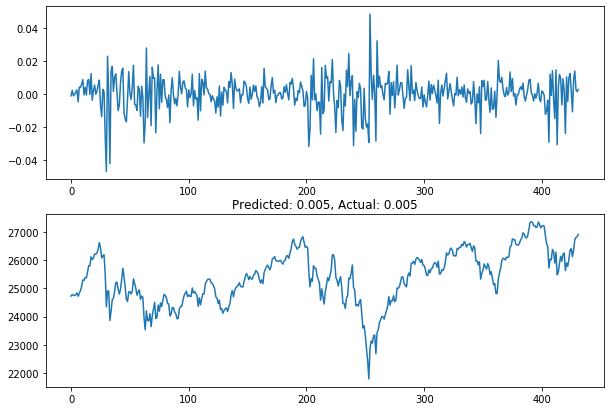

4530
(432,)


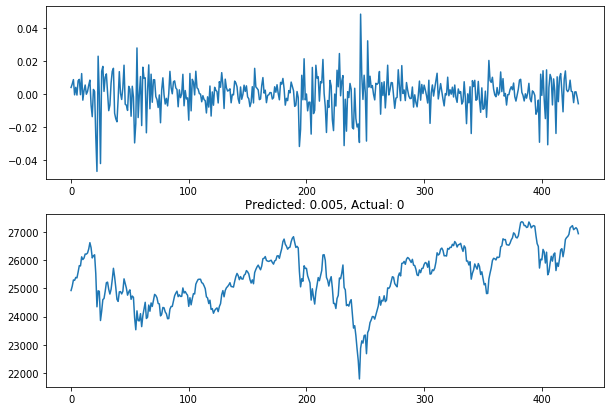

4539
(432,)


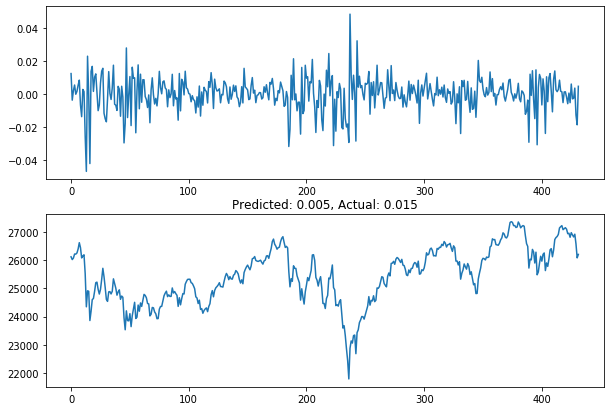

4547
(432,)


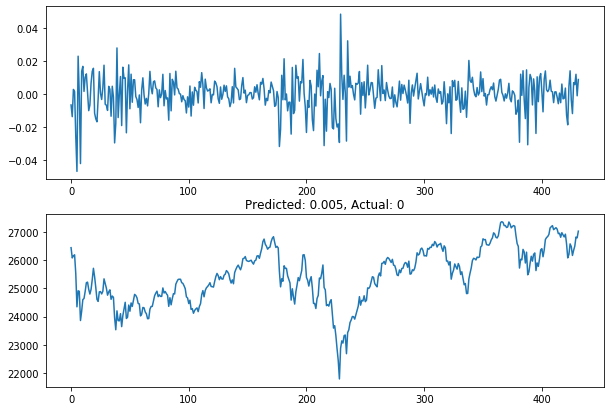

4555
(432,)


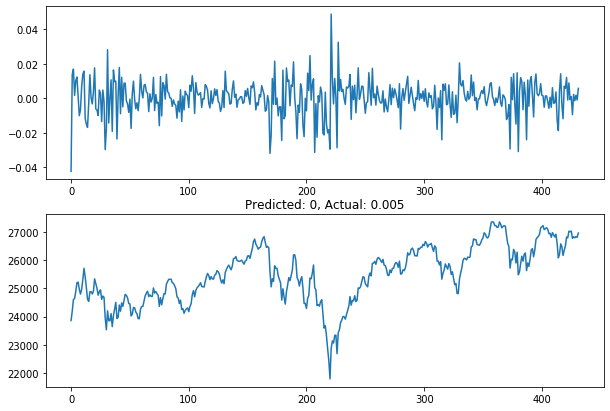

4564
(432,)


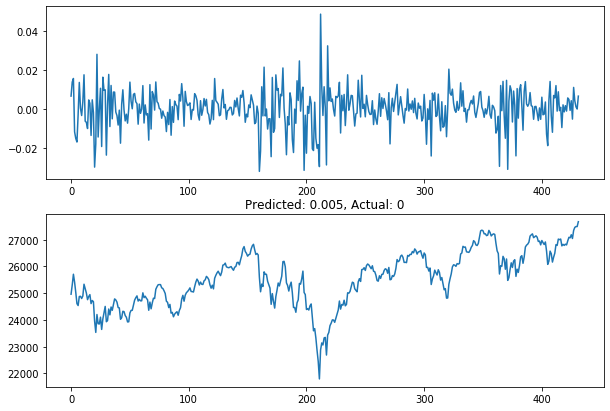

4572
(432,)


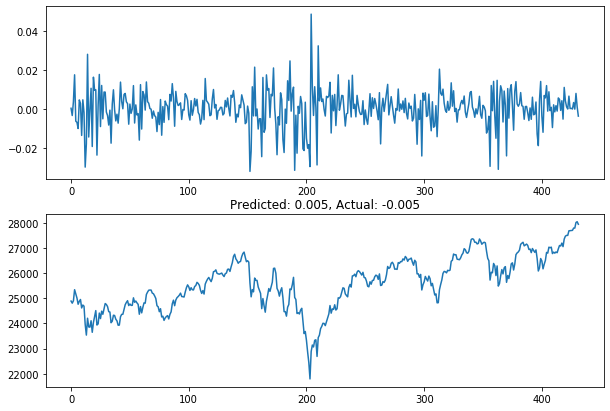

4580
(432,)


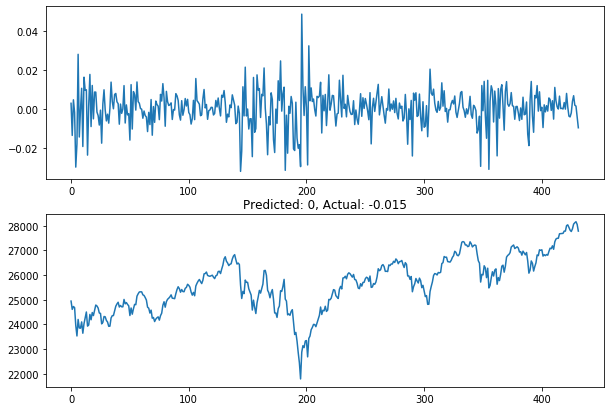

4589
(432,)


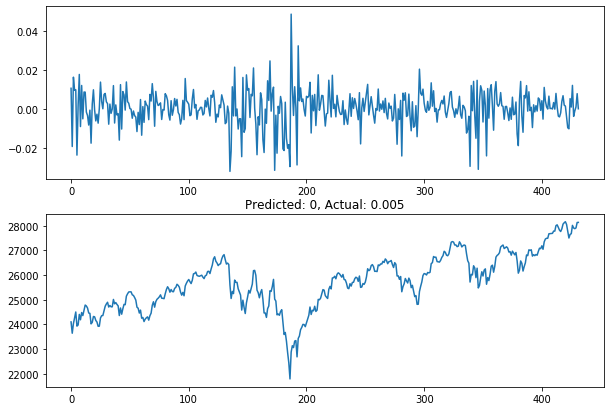

4597
(432,)


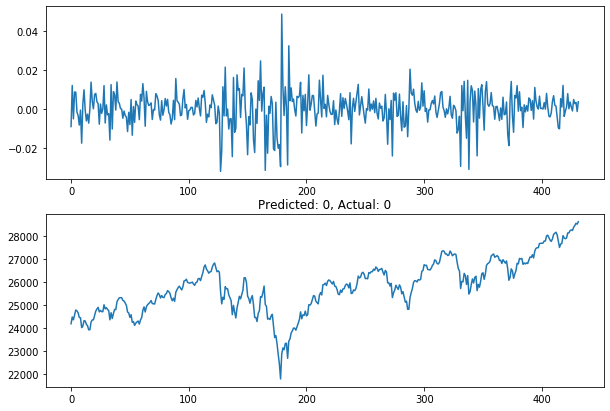

In [20]:
visualise_test(data, df['Close'].values, tst_idx, model, input_length, 1, 100)